# Time Series Analysis (Many To Many)

This section treats the envisaged dataset as a time series problem. Proposed techniques / methodology here is to:
* Covert the featured label into a discrete column value type, instead of continuous.
* Time Shift the provided datasets with varied 'lag' values.
* Combine all 3 matrices into a agglomorated matrix of 61 + 162 + 1179 features (1402). Duplicate columns ('SNAP_ID') will be reduced to a single one.
* Slicing agglomorated matrix into Features/Labels.
* Splitting of train/validation/test set.
* Perform feature selection on the agglomorated matrix, dropping redundant features and finding the  optimum number of features. (Multivariate analysis - through a wrapper approach)
* Feed dataset into a number of machine learning models

A Many to Many approach is opted for in this experiment. The following experiment is trained on a number (greater than 1) of past sequences (t-lag), and all used to train and later predict a number of (t+lag) sequences. This experiment varies from the 'One To One Time Series' Experiment, due to including more than 1 time sequences to train, and predict.

Applicable links:
* https://machinelearningmastery.com/how-to-scale-data-for-long-short-term-memory-networks-in-python/
* https://machinelearningmastery.com/convert-time-series-supervised-learning-problem-python/
* https://machinelearningmastery.com/crash-course-recurrent-neural-networks-deep-learning/
* https://machinelearningmastery.com/time-series-prediction-lstm-recurrent-neural-networks-python-keras/
* https://machinelearningmastery.com/time-series-forecasting-long-short-term-memory-network-python/
* https://machinelearningmastery.com/diagnose-overfitting-underfitting-lstm-models/

### Module Installation and Importing Libraries

* https://machinelearningmastery.com/setup-python-environment-machine-learning-deep-learning-anaconda/
* https://vertexai-plaidml.readthedocs-hosted.com/en/latest/installing.html

In [33]:
# scipy
import scipy as sc
print('scipy: %s' % sc.__version__)
# numpy
import numpy as np
print('numpy: %s' % np.__version__)
# matplotlib
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot
# pandas
import pandas as pd
print('pandas: %s' % pd.__version__)
# statsmodels
import statsmodels
print('statsmodels: %s' % statsmodels.__version__)
# scikit-learn
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, f1_score, accuracy_score, precision_score, recall_score
import sklearn as sk
print('sklearn: %s' % sk.__version__)
# theano
import theano
print('theano: %s' % theano.__version__)
# tensorflow
import tensorflow
print('tensorflow: %s' % tensorflow.__version__)
# plaidml keras
import plaidml.keras
plaidml.keras.install_backend()
# keras
import keras as ke
print('keras: %s' % ke.__version__)
# math
import math
import csv
import os.path
import time

scipy: 1.1.0
numpy: 1.15.2
pandas: 0.23.4
statsmodels: 0.9.0
sklearn: 0.20.0
theano: 1.0.3
tensorflow: 1.11.0
keras: 2.2.2


### Configuration Cell

Tweak parametric changes from this cell to influence outcome of experiment. 
NB: This experiment demonstrates at time  step = 1 (1 minute in advance). Further down in experiment, other timestep results are also featured and evaluated.

In [34]:
# Experiment Config
tpcds='TPCDS1' # Schema upon which to operate test
lag=15 # Time Series shift / Lag Step. Each lag value equates to 1 minute. Cannot be less than 1
if lag < 1:
    raise ValueError('Lag value must be greater than 1!')
nrows=None
bin_value = 2
if bin_value < 2:
    raise ValueError('Number of buckets must be greater than 1')
test_split=.3 # Denotes which Data Split to operate under when it comes to training / validation
sub_sample_start=350 # Denotes frist 0..n samples (Used for plotting purposes)
y_label = ['CPU_TIME_DELTA','OPTIMIZER_COST','EXECUTIONS_DELTA','ELAPSED_TIME_DELTA'] # Denotes which label to use for time series experiments
#
# LSTM Network Structure
epochs=10
batch_size=50

### Read data from file into Pandas Dataframes

In [35]:
# Open Data
#rep_hist_snapshot_path = 'C:/Users/gabriel.sammut/University/Data_ICS5200/Schedule/' + tpcds + '/rep_hist_snapshot.csv'
#rep_hist_sysmetric_summary_path = 'C:/Users/gabriel.sammut/University/Data_ICS5200/Schedule/' + tpcds + '/rep_hist_sysmetric_summary.csv'
#rep_hist_sysstat_path = 'C:/Users/gabriel.sammut/University/Data_ICS5200/Schedule/' + tpcds + '/rep_hist_sysstat.csv'
rep_hist_snapshot_path = 'D:/Projects/Datagenerated_ICS5200/Schedule/' + tpcds + '/rep_hist_snapshot.csv'
rep_hist_sysmetric_summary_path = 'D:/Projects/Datagenerated_ICS5200/Schedule/' + tpcds + '/rep_hist_sysmetric_summary.csv'
rep_hist_sysstat_path = 'D:/Projects/Datagenerated_ICS5200/Schedule/' + tpcds + '/rep_hist_sysstat.csv'

rep_hist_snapshot_df = pd.read_csv(rep_hist_snapshot_path,nrows=nrows)
rep_hist_sysmetric_summary_df = pd.read_csv(rep_hist_sysmetric_summary_path,nrows=nrows)
rep_hist_sysstat_df = pd.read_csv(rep_hist_sysstat_path,nrows=nrows)

def prettify_header(headers):
    """
    Cleans header list from unwated character strings
    """
    header_list = []
    [header_list.append(header.replace("(","").replace(")","").replace("'","").replace(",","")) for header in headers]
    return header_list

rep_hist_snapshot_df.columns = prettify_header(rep_hist_snapshot_df.columns.values)
rep_hist_sysmetric_summary_df.columns = prettify_header(rep_hist_sysmetric_summary_df.columns.values)
rep_hist_sysstat_df.columns = prettify_header(rep_hist_sysstat_df.columns.values)

print(rep_hist_snapshot_df.columns.values)
print(rep_hist_sysmetric_summary_df.columns.values)
print(rep_hist_sysstat_df.columns.values)

['SNAP_ID' 'DBID' 'INSTANCE_NUMBER' 'SQL_ID' 'PLAN_HASH_VALUE'
 'OPTIMIZER_COST' 'OPTIMIZER_MODE' 'OPTIMIZER_ENV_HASH_VALUE'
 'SHARABLE_MEM' 'LOADED_VERSIONS' 'VERSION_COUNT' 'MODULE' 'ACTION'
 'SQL_PROFILE' 'FORCE_MATCHING_SIGNATURE' 'PARSING_SCHEMA_ID'
 'PARSING_SCHEMA_NAME' 'PARSING_USER_ID' 'FETCHES_TOTAL' 'FETCHES_DELTA'
 'END_OF_FETCH_COUNT_TOTAL' 'END_OF_FETCH_COUNT_DELTA' 'SORTS_TOTAL'
 'SORTS_DELTA' 'EXECUTIONS_TOTAL' 'EXECUTIONS_DELTA'
 'PX_SERVERS_EXECS_TOTAL' 'PX_SERVERS_EXECS_DELTA' 'LOADS_TOTAL'
 'LOADS_DELTA' 'INVALIDATIONS_TOTAL' 'INVALIDATIONS_DELTA'
 'PARSE_CALLS_TOTAL' 'PARSE_CALLS_DELTA' 'DISK_READS_TOTAL'
 'DISK_READS_DELTA' 'BUFFER_GETS_TOTAL' 'BUFFER_GETS_DELTA'
 'ROWS_PROCESSED_TOTAL' 'ROWS_PROCESSED_DELTA' 'CPU_TIME_TOTAL'
 'CPU_TIME_DELTA' 'ELAPSED_TIME_TOTAL' 'ELAPSED_TIME_DELTA' 'IOWAIT_TOTAL'
 'IOWAIT_DELTA' 'CLWAIT_TOTAL' 'CLWAIT_DELTA' 'APWAIT_TOTAL'
 'APWAIT_DELTA' 'CCWAIT_TOTAL' 'CCWAIT_DELTA' 'DIRECT_WRITES_TOTAL'
 'DIRECT_WRITES_DELTA' 'PLSEXEC_TIME_T

### Pivoting Tables and Changing Matrix Shapes

Changes all dataframe shapes to be similar to each other, where in a number of snap_id timestamps are cojoined with instance metrics.

In [36]:
print('Header Lengths [Before Pivot]')
print('REP_HIST_SNAPSHOT: ' + str(len(rep_hist_snapshot_df.columns)))
print('REP_HIST_SYSMETRIC_SUMMARY: ' + str(len(rep_hist_sysmetric_summary_df.columns)))
print('REP_HIST_SYSSTAT: ' + str(len(rep_hist_sysstat_df.columns)))

# Table REP_HIST_SYSMETRIC_SUMMARY
rep_hist_sysmetric_summary_df = rep_hist_sysmetric_summary_df.pivot(index='SNAP_ID', columns='METRIC_NAME', values='AVERAGE')
rep_hist_sysmetric_summary_df.reset_index(inplace=True)
rep_hist_sysmetric_summary_df[['SNAP_ID']] = rep_hist_sysmetric_summary_df[['SNAP_ID']].astype(int)
#rep_hist_sysmetric_summary_df = rep_hist_sysstat_df.groupby(['SNAP_ID']).sum()
rep_hist_sysmetric_summary_df.reset_index(inplace=True)
rep_hist_sysmetric_summary_df.sort_values(by=['SNAP_ID'],inplace=True,ascending=True)

# Table REP_HIST_SYSSTAT
rep_hist_sysstat_df = rep_hist_sysstat_df.pivot(index='SNAP_ID', columns='STAT_NAME', values='VALUE')
rep_hist_sysstat_df.reset_index(inplace=True)
rep_hist_sysstat_df[['SNAP_ID']] = rep_hist_sysstat_df[['SNAP_ID']].astype(int)
#rep_hist_sysstat_df = rep_hist_sysstat_df.groupby(['SNAP_ID']).sum()
rep_hist_sysstat_df.reset_index(inplace=True)
rep_hist_sysstat_df.sort_values(by=['SNAP_ID'],inplace=True,ascending=True)

rep_hist_sysmetric_summary_df.rename(str.upper, inplace=True, axis='columns')
rep_hist_sysstat_df.rename(str.upper, inplace=True, axis='columns')

# Group By Values by SNAP_ID , sum all metrics (for table REP_HIST_SNAPSHOT)
rep_hist_snapshot_df = rep_hist_snapshot_df.groupby(['SNAP_ID','DBID','INSTANCE_NUMBER']).sum()
rep_hist_snapshot_df.reset_index(inplace=True)

print('\nHeader Lengths [After Pivot]')
print('REP_HIST_SNAPSHOT: ' + str(len(rep_hist_snapshot_df.columns)))
print('REP_HIST_SYSMETRIC_SUMMARY: ' + str(len(rep_hist_sysmetric_summary_df.columns)))
print('REP_HIST_SYSSTAT: ' + str(len(rep_hist_sysstat_df.columns)))

# DF Shape
print('\nDataframe shapes:\nTable [REP_HIST_SNAPSHOT] - ' + str(rep_hist_snapshot_df.shape))
print('Table [REP_HIST_SYSMETRIC_SUMMARY] - ' + str(rep_hist_sysmetric_summary_df.shape))
print('Table [REP_HIST_SYSSTAT] - ' + str(rep_hist_sysstat_df.shape))

Header Lengths [Before Pivot]
REP_HIST_SNAPSHOT: 90
REP_HIST_SYSMETRIC_SUMMARY: 26
REP_HIST_SYSSTAT: 16

Header Lengths [After Pivot]
REP_HIST_SNAPSHOT: 77
REP_HIST_SYSMETRIC_SUMMARY: 163
REP_HIST_SYSSTAT: 1180

Dataframe shapes:
Table [REP_HIST_SNAPSHOT] - (19831, 77)
Table [REP_HIST_SYSMETRIC_SUMMARY] - (19831, 163)
Table [REP_HIST_SYSSTAT] - (19831, 1180)


### Dealing with Empty Values

In [37]:
def get_na_columns(df, headers):
    """
    Return columns which consist of NAN values
    """
    na_list = []
    for head in headers:
        if df[head].isnull().values.any():
            na_list.append(head)
    return na_list

print('N/A Columns\n')
print('\n REP_HIST_SNAPSHOT Features ' + str(len(rep_hist_snapshot_df.columns)) + ': ' + str(get_na_columns(df=rep_hist_snapshot_df,headers=rep_hist_snapshot_df.columns)) + "\n")
print('REP_HIST_SYSMETRIC_SUMMARY Features ' + str(len(rep_hist_sysmetric_summary_df.columns)) + ': ' + str(get_na_columns(df=rep_hist_sysmetric_summary_df,headers=rep_hist_sysmetric_summary_df.columns)) + "\n")
print('REP_HIST_SYSSTAT Features ' + str(len(rep_hist_sysstat_df.columns)) + ': ' + str(get_na_columns(df=rep_hist_sysstat_df,headers=rep_hist_sysstat_df.columns)) + "\n")

def fill_na(df):
    """
    Replaces NA columns with 0s
    """
    return df.fillna(0)

# Populating NaN values with amount '0'
rep_hist_snapshot_df = fill_na(df=rep_hist_snapshot_df)
rep_hist_sysmetric_summary_df = fill_na(df=rep_hist_sysmetric_summary_df)
rep_hist_sysstat_df = fill_na(df=rep_hist_sysstat_df)

N/A Columns


 REP_HIST_SNAPSHOT Features 77: []

REP_HIST_SYSMETRIC_SUMMARY Features 163: ['ACTIVE PARALLEL SESSIONS', 'ACTIVE SERIAL SESSIONS', 'AVERAGE ACTIVE SESSIONS', 'AVERAGE SYNCHRONOUS SINGLE-BLOCK READ LATENCY', 'BACKGROUND CPU USAGE PER SEC', 'BACKGROUND TIME PER SEC', 'CAPTURED USER CALLS', 'CELL PHYSICAL IO INTERCONNECT BYTES', 'HOST CPU USAGE PER SEC', 'I/O MEGABYTES PER SECOND', 'I/O REQUESTS PER SECOND', 'PX OPERATIONS NOT DOWNGRADED PER SEC', 'REPLAYED USER CALLS', 'RUN QUEUE PER SEC', 'SESSION COUNT', 'TEMP SPACE USED', 'TOTAL PGA ALLOCATED', 'TOTAL PGA USED BY SQL WORKAREAS', 'VM IN BYTES PER SEC', 'VM OUT BYTES PER SEC', 'WORKLOAD CAPTURE AND REPLAY STATUS']

REP_HIST_SYSSTAT Features 1180: ['BA SPARE STATISTIC 9', 'CLI FLSTASK CREATE', 'EHCC COMPRESSED LENGTH COMPRESSED', 'EFFECTIVE IO TIME', 'FORWARDED 2PC COMMANDS ACROSS RAC NODES', 'IM POPULATE (FASTSTART) CUS READ ATTEMPTS', 'IM POPULATE CUS MEMCOMPRESS FOR CAPACITY LOW', 'IM REPOPULATE (TRICKLE) CUS MEMCOMPRES

### Merging Frames

This part merges the following pandas data frame into a single frame:
* REP_HIST_SNAPSHOT
* REP_HIST_SYSMETRIC_SUMMARY
* REP_HIST_SYSSTAT

In [38]:
df = pd.merge(rep_hist_snapshot_df, rep_hist_sysmetric_summary_df,how='inner',on ='SNAP_ID')
df = pd.merge(df, rep_hist_sysstat_df,how='inner',on ='SNAP_ID')
print(df.shape)
print('----------------------------------')
print(df.columns.tolist())

(19831, 1418)
----------------------------------
['SNAP_ID', 'DBID', 'INSTANCE_NUMBER', 'PLAN_HASH_VALUE', 'OPTIMIZER_COST', 'OPTIMIZER_ENV_HASH_VALUE', 'SHARABLE_MEM', 'LOADED_VERSIONS', 'VERSION_COUNT', 'SQL_PROFILE', 'PARSING_SCHEMA_ID', 'PARSING_USER_ID', 'FETCHES_TOTAL', 'FETCHES_DELTA', 'END_OF_FETCH_COUNT_TOTAL', 'END_OF_FETCH_COUNT_DELTA', 'SORTS_TOTAL', 'SORTS_DELTA', 'EXECUTIONS_TOTAL', 'EXECUTIONS_DELTA', 'PX_SERVERS_EXECS_TOTAL', 'PX_SERVERS_EXECS_DELTA', 'LOADS_TOTAL', 'LOADS_DELTA', 'INVALIDATIONS_TOTAL', 'INVALIDATIONS_DELTA', 'PARSE_CALLS_TOTAL', 'PARSE_CALLS_DELTA', 'DISK_READS_TOTAL', 'DISK_READS_DELTA', 'BUFFER_GETS_TOTAL', 'BUFFER_GETS_DELTA', 'ROWS_PROCESSED_TOTAL', 'ROWS_PROCESSED_DELTA', 'CPU_TIME_TOTAL', 'CPU_TIME_DELTA', 'ELAPSED_TIME_TOTAL', 'ELAPSED_TIME_DELTA', 'IOWAIT_TOTAL', 'IOWAIT_DELTA', 'CLWAIT_TOTAL', 'CLWAIT_DELTA', 'APWAIT_TOTAL', 'APWAIT_DELTA', 'CCWAIT_TOTAL', 'CCWAIT_DELTA', 'DIRECT_WRITES_TOTAL', 'DIRECT_WRITES_DELTA', 'PLSEXEC_TIME_TOTAL', 'PLS

### Data Ordering

Sorting of datasets in order of SNAP_ID.

In [39]:
df.sort_values(by=['SNAP_ID'], ascending=True, inplace=True)
print(df.shape)

(19831, 1418)


### Floating point precision conversion

Each column is converted into a column of type values which are floating point for higher precision.

In [40]:
df.astype('float32', inplace=True)
df = np.round(df, 3) # rounds to 3 dp
print(df.shape)

(19831, 1418)


### Feature Selection

In this step, redundant features are dropped. Features are considered redundant if exhibit a standard devaition of 0 (meaning no change in value).

In [41]:
def drop_flatline_columns(df):
    columns = df.columns
    flatline_features = []
    for i in range(len(columns)):
        try:
            std = df[columns[i]].std()
            if std == 0:
                flatline_features.append(columns[i])
        except:
            pass
    
    print('\nShape before changes: [' + str(df.shape) + ']')
    df = df.drop(columns=flatline_features)
    print('Shape after changes: [' + str(df.shape) + ']')
    print('Dropped a total [' + str(len(flatline_features)) + ']')
    return df

print('Before column drop:')
print(df.shape)
df = drop_flatline_columns(df=df)
print('\nAfter flatline column drop:')
print(df.shape)
dropped_columns_df = [ 'PLAN_HASH_VALUE',
                       'OPTIMIZER_ENV_HASH_VALUE',
                       'LOADED_VERSIONS',
                       'VERSION_COUNT',
                       'PARSING_SCHEMA_ID',
                       'PARSING_USER_ID',
                       'CON_DBID',
                       'SNAP_LEVEL',
                       'SNAP_FLAG',
                       'COMMAND_TYPE']
df.drop(columns=dropped_columns_df, inplace=True)
print('\nAfter additional column drop:')
print(df.shape)

Before column drop:
(19831, 1418)

Shape before changes: [(19831, 1418)]
Shape after changes: [(19831, 521)]
Dropped a total [897]

After flatline column drop:
(19831, 521)

After additional column drop:
(19831, 511)


## Visualizing Labels

https://machinelearningmastery.com/a-gentle-introduction-to-normality-tests-in-python/

### Histograms

A simple and commonly used plot to quickly check the distribution of a sample of data is the histogram.

In the histogram, the data is divided into a pre-specified number of groups called bins. The data is then sorted into each bin and the count of the number of observations in each bin is retained.

The plot shows the bins across the x-axis maintaining their ordinal relationship, and the count in each bin on the y-axis.

A sample of data has a Gaussian distribution of the histogram plot, showing the familiar bell shape.

### Quantile-Quantile Plot

Another popular plot for checking the distribution of a data sample is the quantile-quantile plot, Q-Q plot, or QQ plot for short.

This plot generates its own sample of the idealized distribution that we are comparing with, in this case the Gaussian distribution. The idealized samples are divided into groups (e.g. 5), called quantiles. Each data point in the sample is paired with a similar member from the idealized distribution at the same cumulative distribution.

The resulting points are plotted as a scatter plot with the idealized value on the x-axis and the data sample on the y-axis.

A perfect match for the distribution will be shown by a line of dots on a 45-degree angle from the bottom left of the plot to the top right. Often a line is drawn on the plot to help make this expectation clear. Deviations by the dots from the line shows a deviation from the expected distribution.

### Shapiro-Wilk Test

The Shapiro-Wilk test evaluates a data sample and quantifies how likely it is that the data was drawn from a Gaussian distribution, named for Samuel Shapiro and Martin Wilk.

In practice, the Shapiro-Wilk test is believed to be a reliable test of normality, although there is some suggestion that the test may be suitable for smaller samples of data, e.g. thousands of observations or fewer.

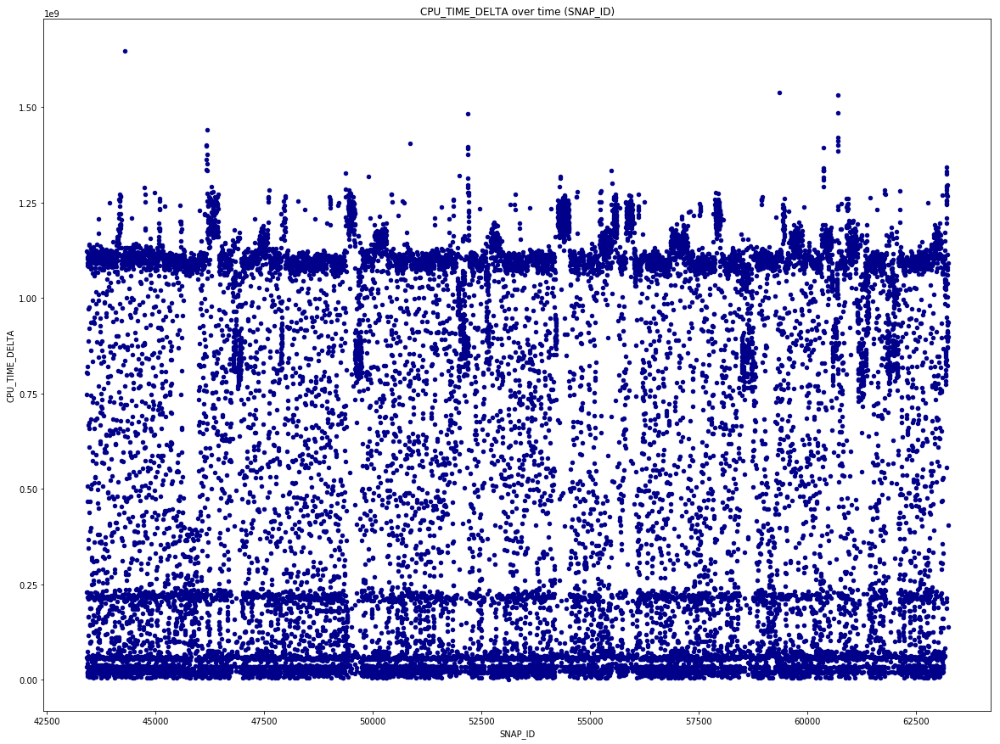

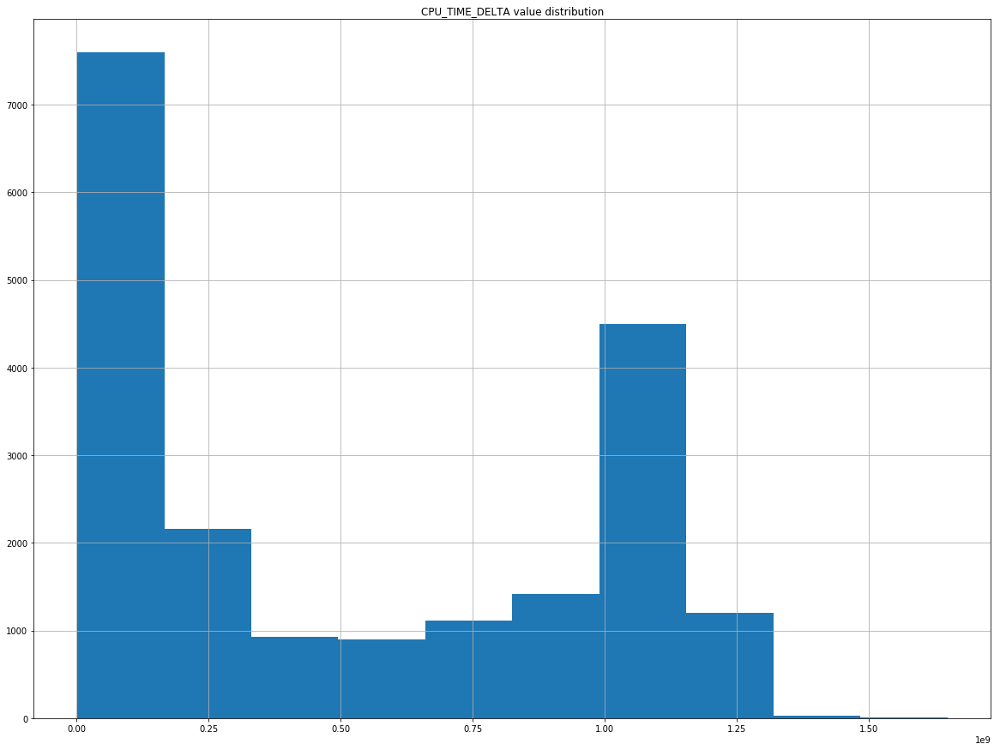

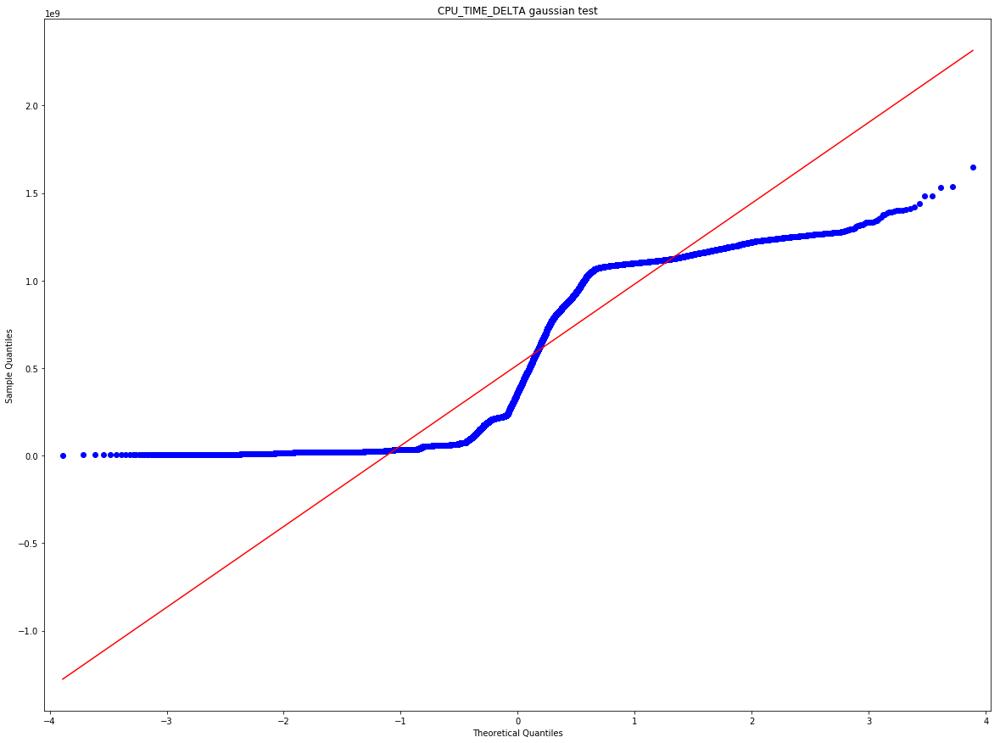

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Statistics=0.827, p=0.000
Sample does not look Gaussian (reject H0)


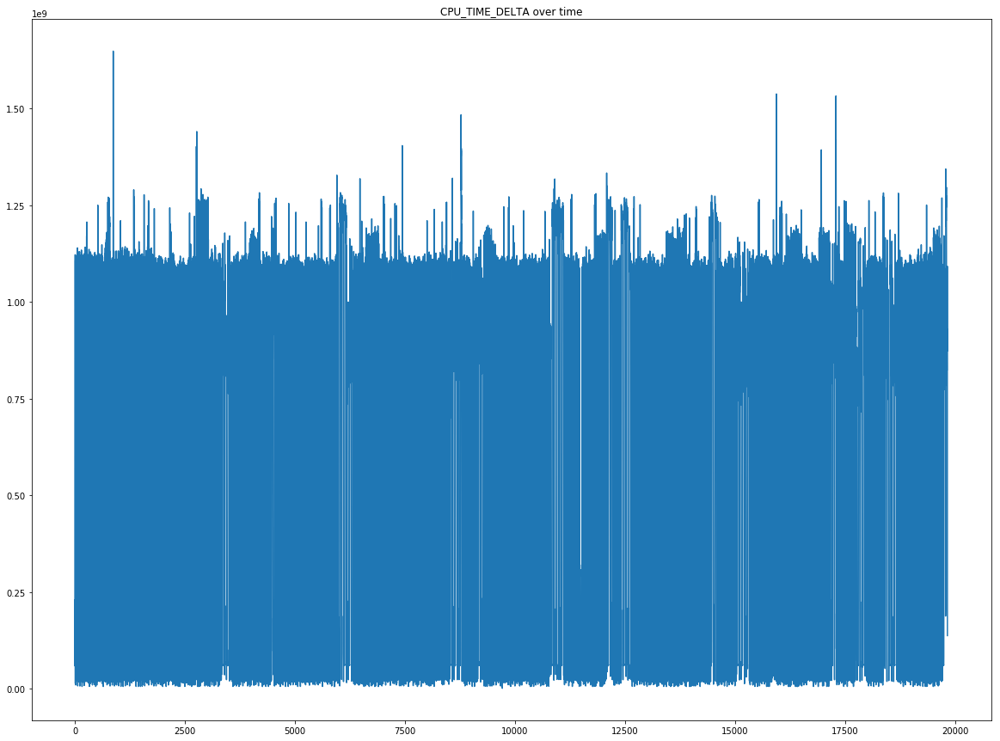

---------------------------------------------------------------


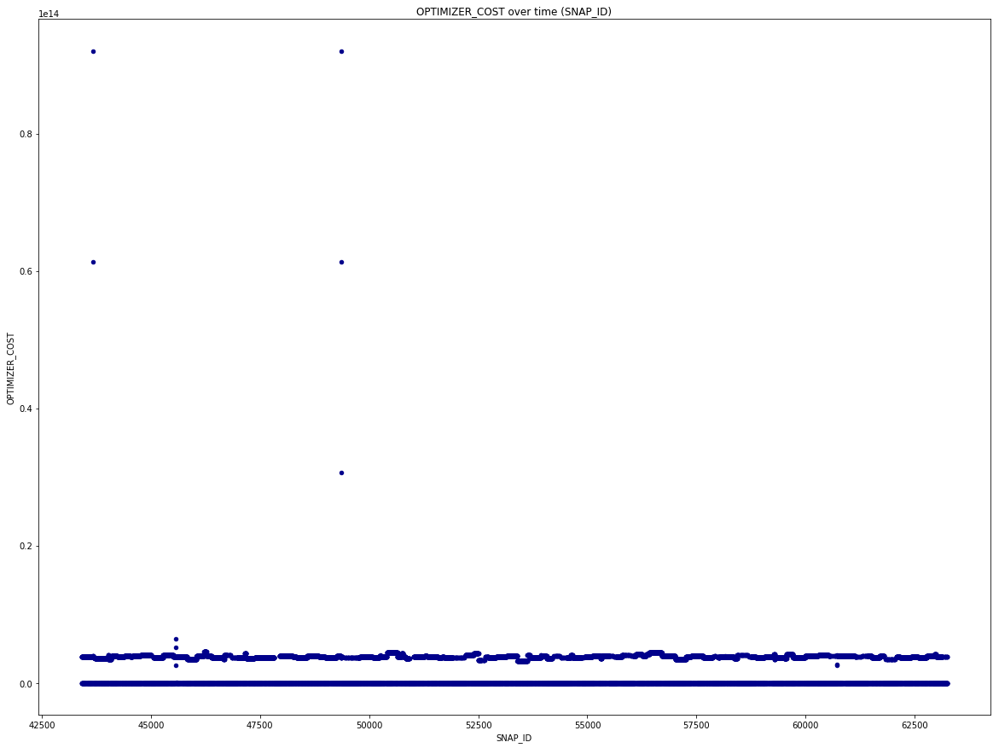

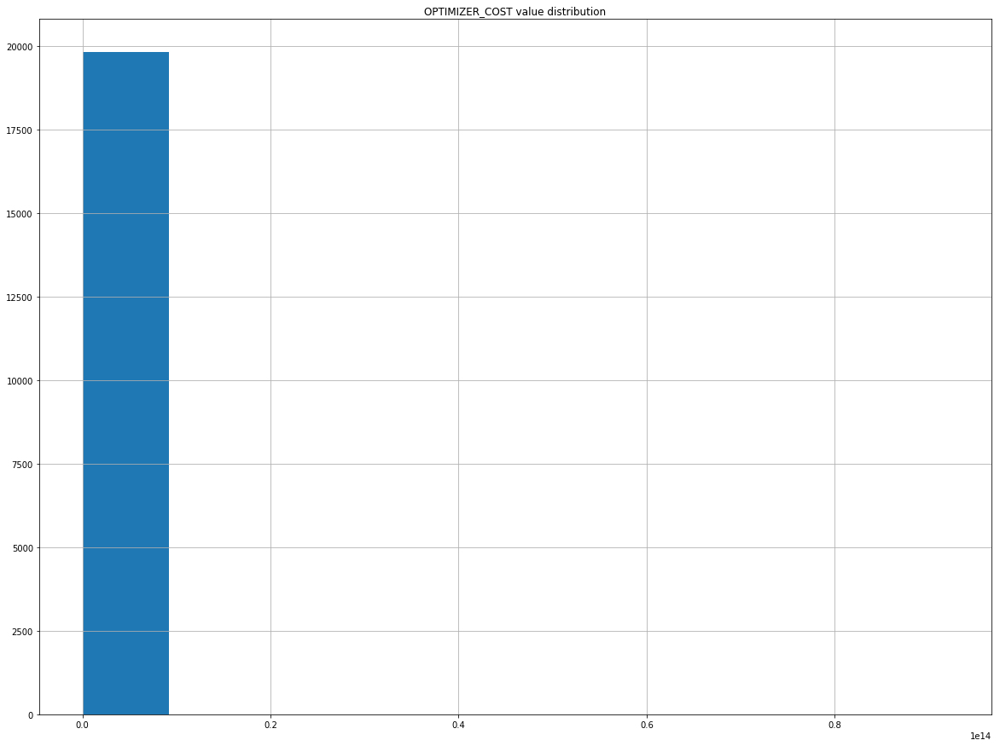

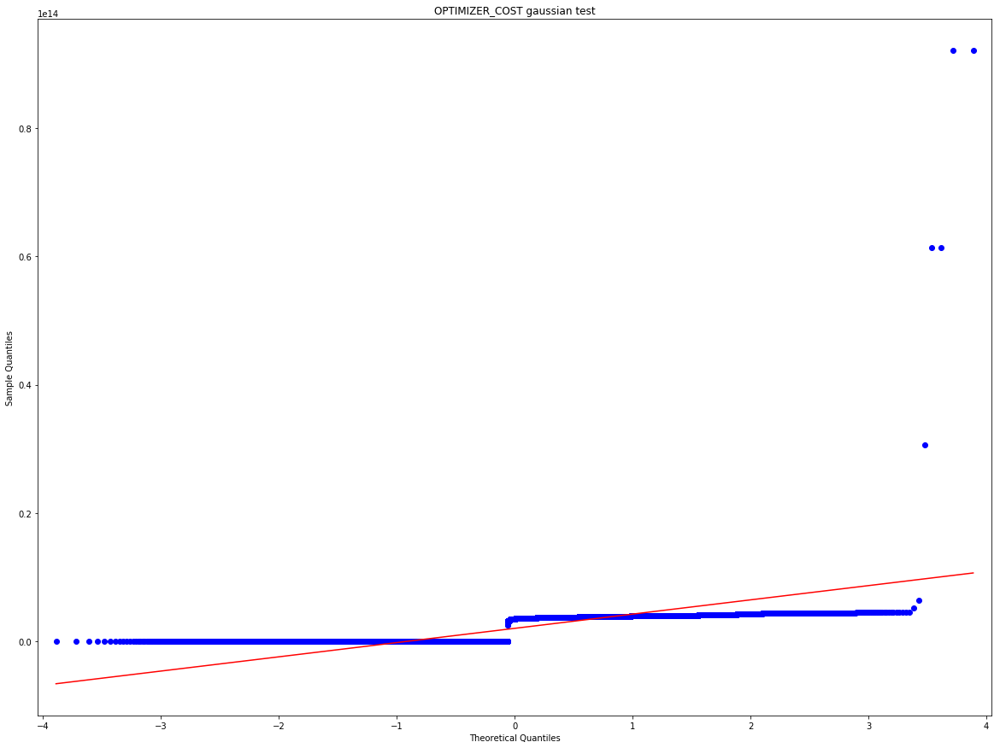

Statistics=0.559, p=0.000
Sample does not look Gaussian (reject H0)


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


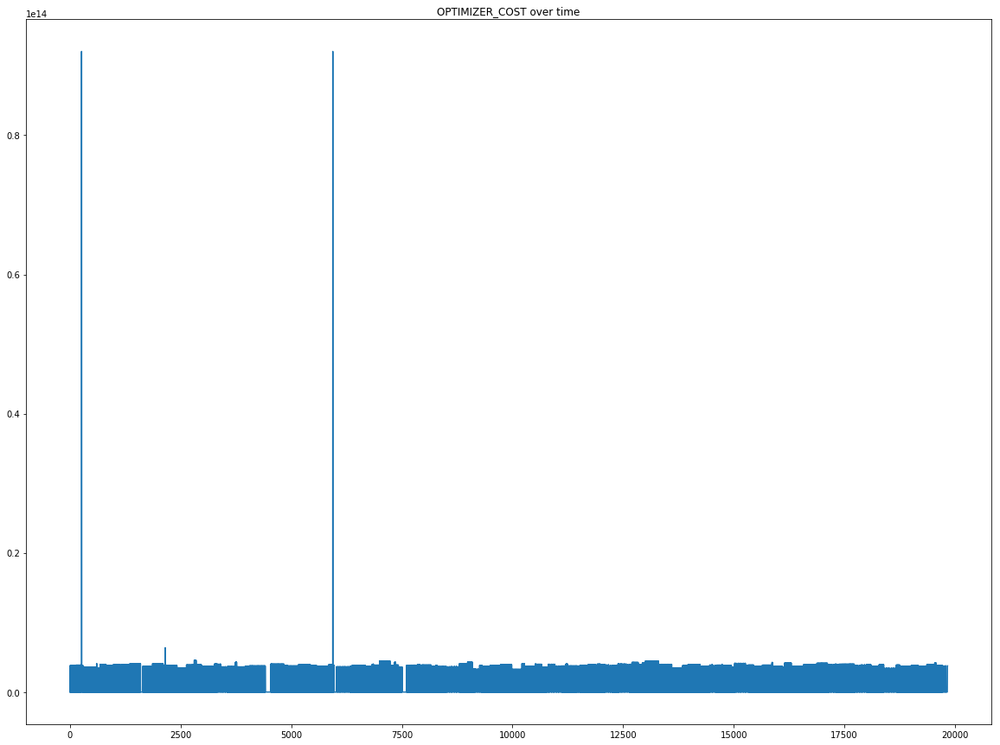

---------------------------------------------------------------


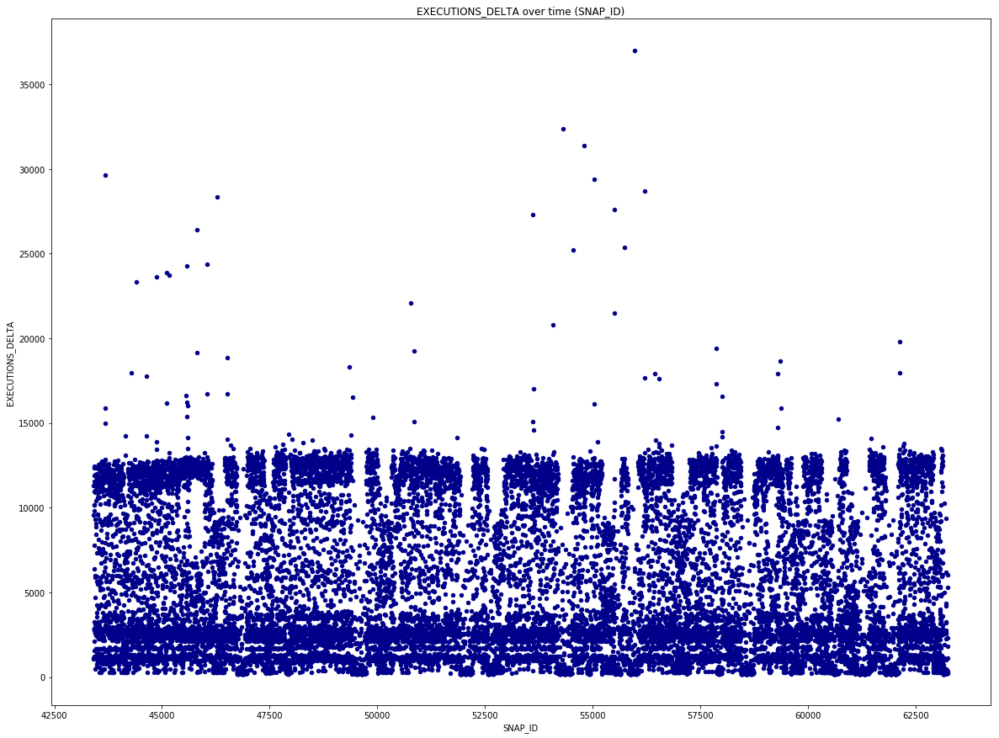

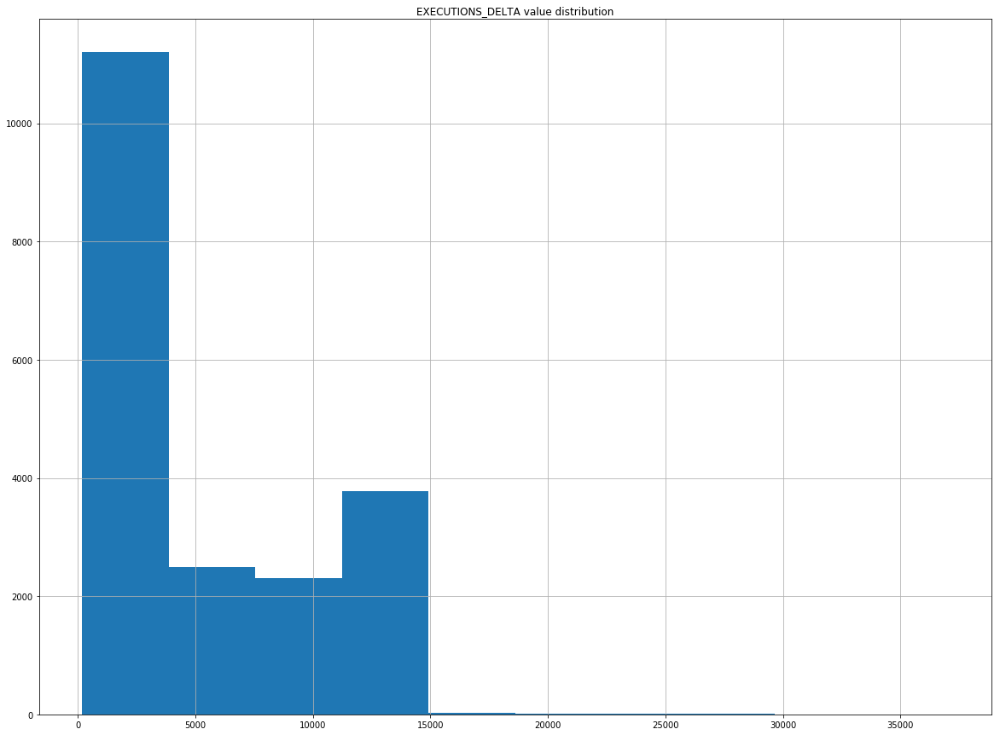

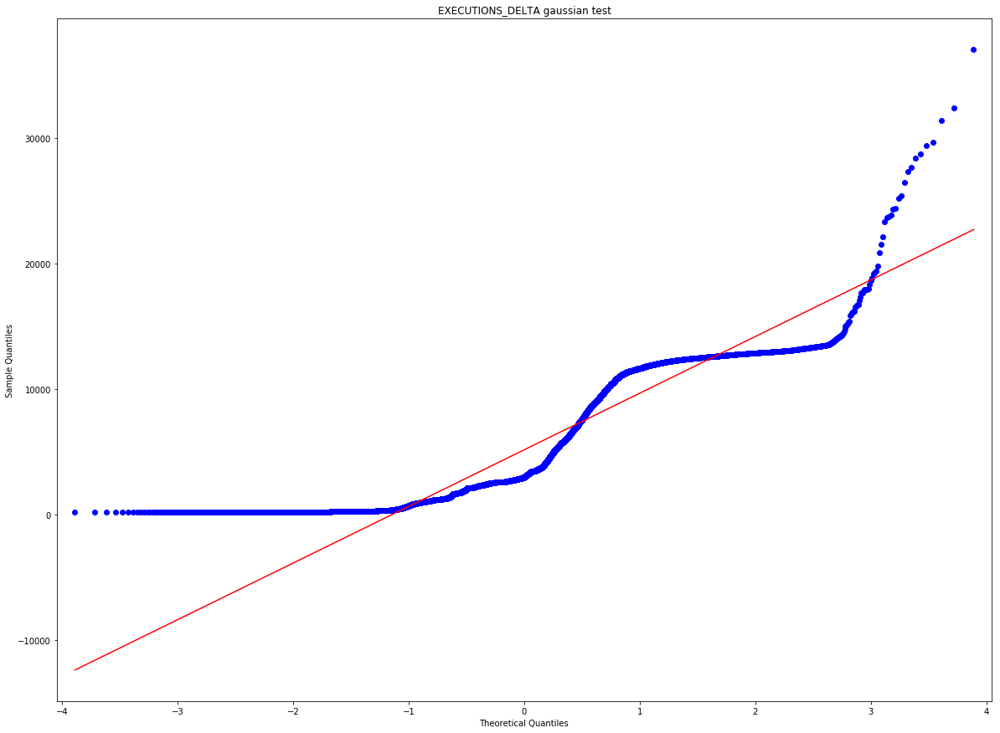

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Statistics=0.858, p=0.000
Sample does not look Gaussian (reject H0)


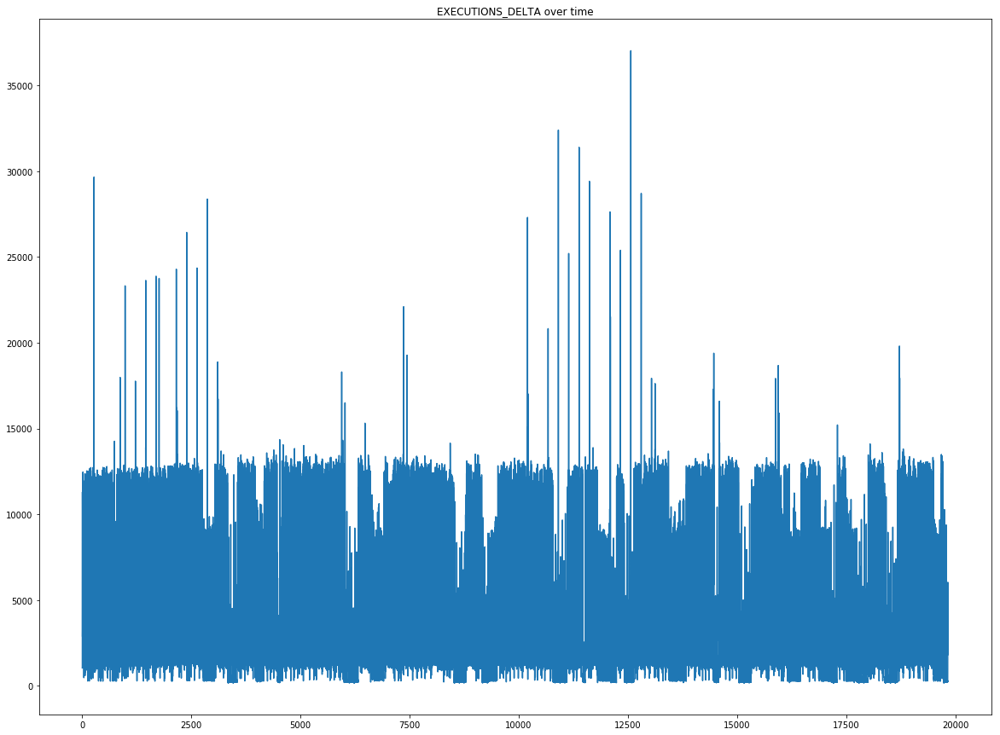

---------------------------------------------------------------


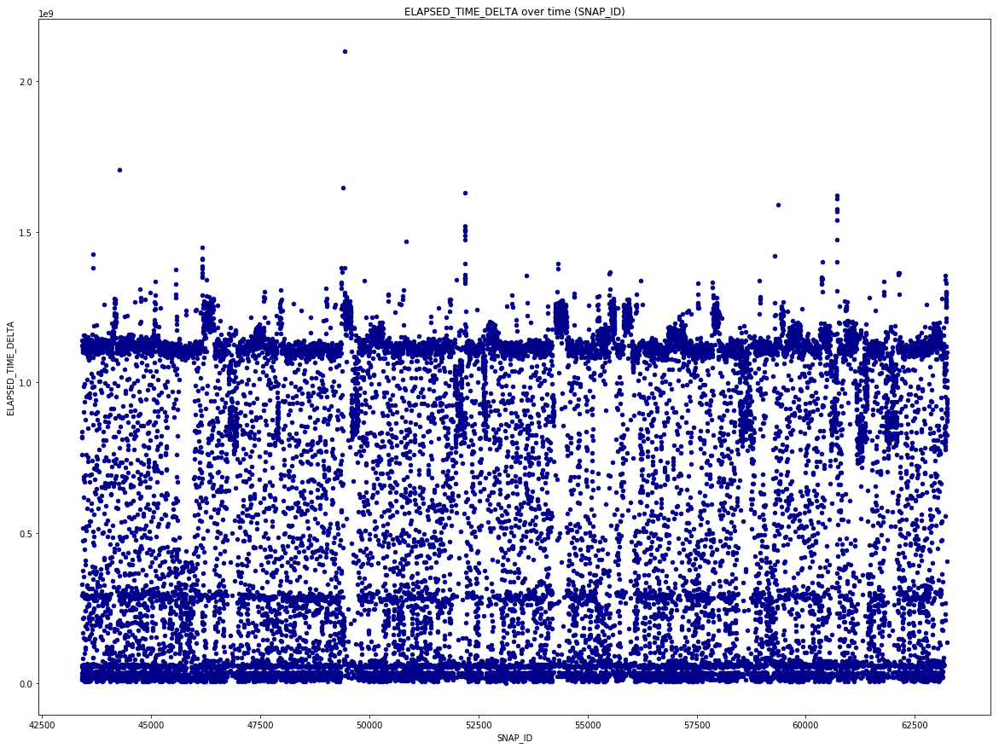

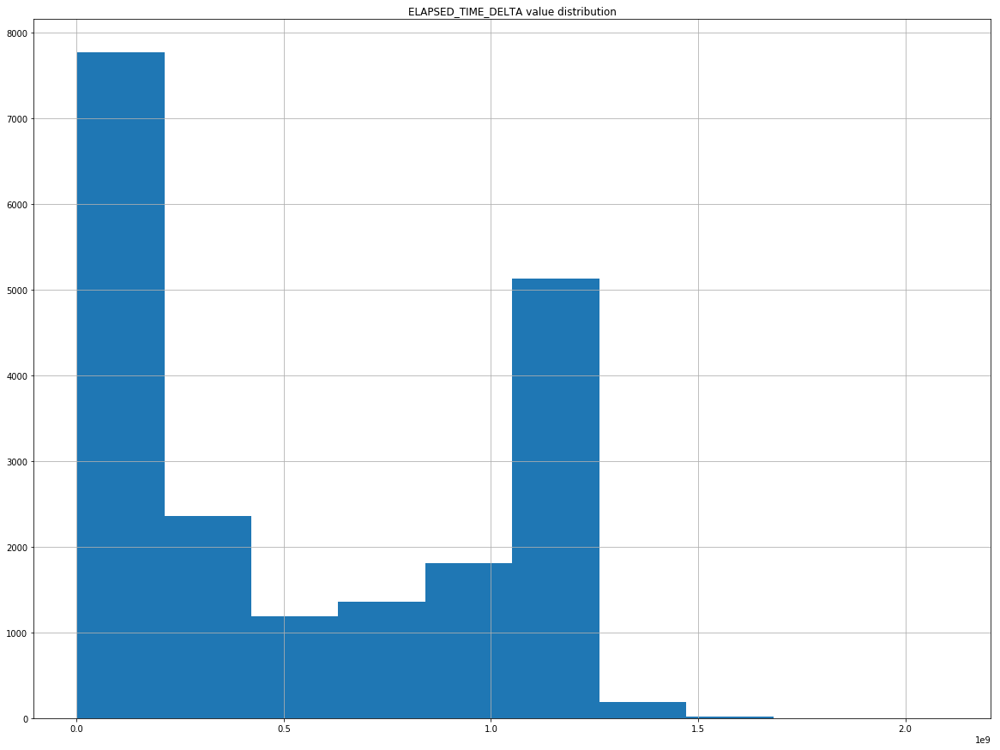

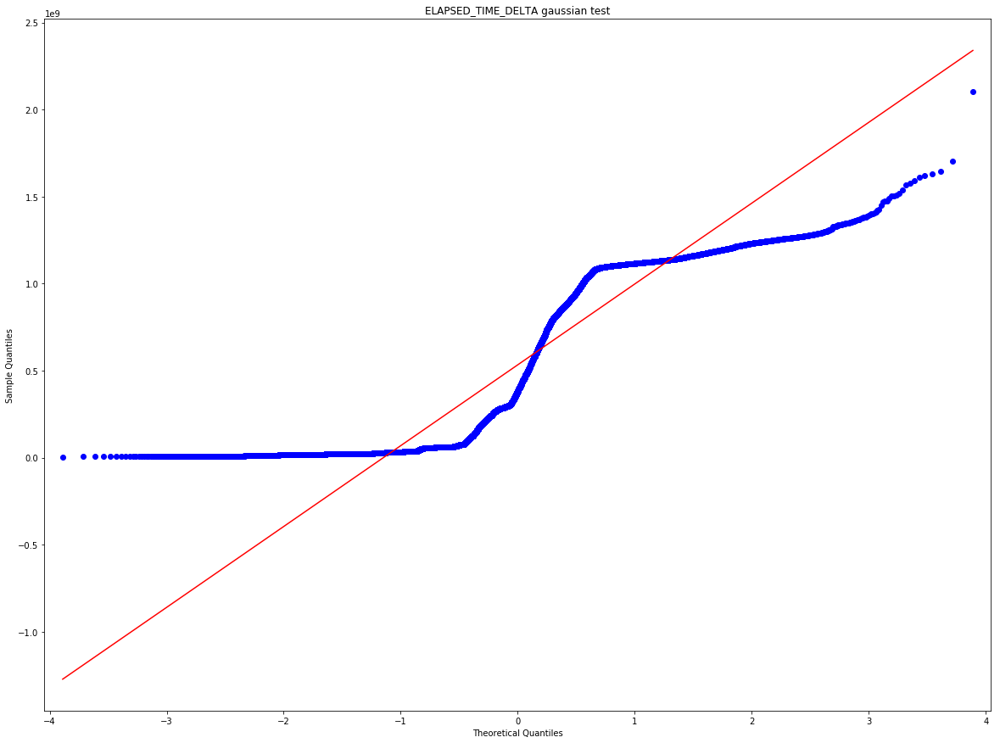

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Statistics=0.837, p=0.000
Sample does not look Gaussian (reject H0)


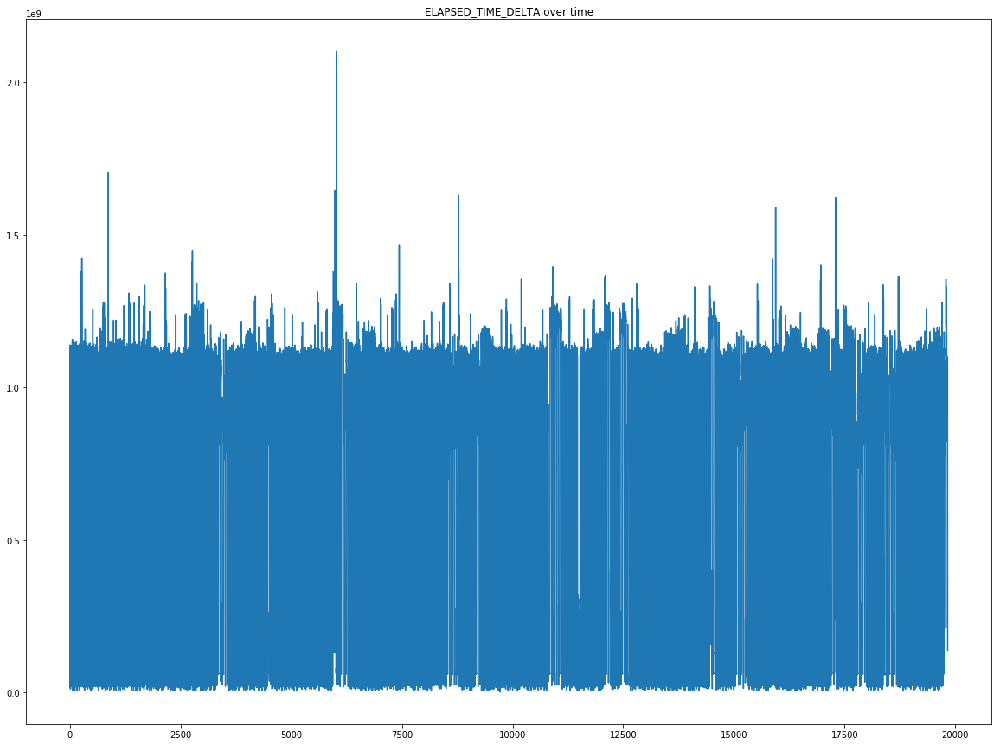

---------------------------------------------------------------


In [42]:
def shapiro_wilk(data):
    # normality test
    stat, p = sc.stats.shapiro(data)
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        print('Sample looks Gaussian (fail to reject H0)')
    else:
        print('Sample does not look Gaussian (reject H0)')

for label in y_label:
    
    df.plot.scatter(x='SNAP_ID',
                    y=label,
                    c='DarkBlue')
    plt.title(label + " over time (SNAP_ID)")
    plt.show()
    
    df[label].hist(bins=10)
    plt.title(label + ' value distribution')
    plt.show()
    
    qqplot(df[label], line='s')
    plt.title(label + ' gaussian test')
    plt.show()
    
    shapiro_wilk(data=df[label])
    
    df[label].plot.line()
    plt.title(label + ' over time')
    plt.show()
    print('---------------------------------------------------------------')

### Outlier Detection - Standard Deviation Method

Detection and transformation of outliers, categorized as more than 3 standard deviations away.

If we know that the distribution of values in the sample is Gaussian or Gaussian-like, we can use the standard deviation of the sample as a cut-off for identifying outliers.

The Gaussian distribution has the property that the standard deviation from the mean can be used to reliably summarize the percentage of values in the sample.

For example, within one standard deviation of the mean will cover 68% of the data.

So, if the mean is 50 and the standard deviation is 5, as in the test dataset above, then all data in the sample between 45 and 55 will account for about 68% of the data sample. We can cover more of the data sample if we expand the range as follows:

* 1 Standard Deviation from the Mean: 68%
* 2 Standard Deviations from the Mean: 95%
* 3 Standard Deviations from the Mean: 99.7%

A value that falls outside of 3 standard deviations is part of the distribution, but it is an unlikely or rare event at approximately 1 in 370 samples.

Three standard deviations from the mean is a common cut-off in practice for identifying outliers in a Gaussian or Gaussian-like distribution. For smaller samples of data, perhaps a value of 2 standard deviations (95%) can be used, and for larger samples, perhaps a value of 4 standard deviations (99.9%) can be used.

More infor here: https://machinelearningmastery.com/how-to-use-statistics-to-identify-outliers-in-data/

In [43]:
def get_outliers_std(df=None, headers=None):
    """
    Detect and return which rows are considered outliers within the dataset, determined by :quartile_limit (99%)
    """
    outlier_rows = [] # This list of lists consists of elements of the following notation [column,rowid]
    for header in headers:
        outlier_count = 0
        try:
            # calculate summary statistics
            data_mean, data_std = df[header].mean(), df[header].std()
            # identify outliers
            cut_off = data_std * 3
            lower, upper = data_mean - cut_off, data_mean + cut_off
            
            series_row = (df[df[header] > upper].index)
            outlier_count += len(list(np.array(series_row)))
            for id in list(np.array(series_row)):
                outlier_rows.append([header,id])
            
            series_row = (df[df[header] < lower].index)
            outlier_count += len(list(np.array(series_row)))
            for id in list(np.array(series_row)):
                outlier_rows.append([header,id])
            print(header + ' - [' + str(outlier_count) + '] outliers')
        except Exception as e:
            print(str(e))
    
    unique_outlier_rows = []
    for col, rowid in outlier_rows:
        unique_outlier_rows.append([col,rowid])
    return unique_outlier_rows

#Printing outliers to screen
outliers = get_outliers_std(df=df,
                            headers=y_label)
print('Total Outliers: [' + str(len(outliers)) + ']\n')
for label in y_label:
    min_val = df[label].min()
    max_val = df[label].max()
    mean_val = df[label].mean()
    std_val = df[label].std()
    print('Label[' + label + '] - Min[' + str(min_val) + '] - Max[' + str(max_val) + '] - Mean[' + str(mean_val) + '] - Std[' + str(std_val) + ']')
print('\n---------------------------------------------\n')
for i in range(len(outliers)):
    print('Header [' + str(outliers[i][0]) + '] - Location [' + str(outliers[i][1]) + '] - Value [' + str(df.iloc[outliers[i][1]][outliers[i][0]]) + ']') 

CPU_TIME_DELTA - [0] outliers
OPTIMIZER_COST - [5] outliers
EXECUTIONS_DELTA - [26] outliers
ELAPSED_TIME_DELTA - [1] outliers
Total Outliers: [32]

Label[CPU_TIME_DELTA] - Min[1159193] - Max[1648357491] - Mean[518526608.6108618] - Std[461779238.5752716]
Label[OPTIMIZER_COST] - Min[3626.0] - Max[92046062138660.98] - Mean[2030641359290.8916] - Std[2220038898365.211]
Label[EXECUTIONS_DELTA] - Min[185.0] - Max[37019.0] - Mean[5151.636730371641] - Std[4512.069984573459]
Label[ELAPSED_TIME_DELTA] - Min[1363695] - Max[2101457535] - Mean[533360408.8296102] - Std[464544681.6220179]

---------------------------------------------

Header [OPTIMIZER_COST] - Location [264] - Value [92046039118348.0]
Header [OPTIMIZER_COST] - Location [265] - Value [61364026218553.0]
Header [OPTIMIZER_COST] - Location [5939] - Value [61364041513048.0]
Header [OPTIMIZER_COST] - Location [5940] - Value [92046062138660.98]
Header [OPTIMIZER_COST] - Location [5941] - Value [30682020982737.0]
Header [EXECUTIONS_DELTA] -

### Outlier Detection - Interquartile Range Method

https://machinelearningmastery.com/how-to-use-statistics-to-identify-outliers-in-data/

Not all data is normal or normal enough to treat it as being drawn from a Gaussian distribution.

A good statistic for summarizing a non-Gaussian distribution sample of data is the Interquartile Range, or IQR for short.

The IQR is calculated as the difference between the 75th and the 25th percentiles of the data and defines the box in a box and whisker plot.

Remember that percentiles can be calculated by sorting the observations and selecting values at specific indices. The 50th percentile is the middle value, or the average of the two middle values for an even number of examples. If we had 10,000 samples, then the 50th percentile would be the average of the 5000th and 5001st values.

We refer to the percentiles as quartiles (“quart” meaning 4) because the data is divided into four groups via the 25th, 50th and 75th values.

The IQR defines the middle 50% of the data, or the body of the data.

The IQR can be used to identify outliers by defining limits on the sample values that are a factor k of the IQR below the 25th percentile or above the 75th percentile. The common value for the factor k is the value 1.5. A factor k of 3 or more can be used to identify values that are extreme outliers or “far outs” when described in the context of box and whisker plots.

On a box and whisker plot, these limits are drawn as fences on the whiskers (or the lines) that are drawn from the box. Values that fall outside of these values are drawn as dots.

In [44]:
def get_outliers_quartile(df=None, headers=None):
    """
    Detect and return which rows are considered outliers within the dataset, determined by :quartile_limit (99%)
    """
    outlier_rows = [] # This list of lists consists of elements of the following notation [column,rowid]
    for header in headers:
        outlier_count = 0
        try:
            q25, q75 = np.percentile(df[header], 25), np.percentile(df[header], 75)
            iqr = q75 - q25
            cut_off = iqr * .6 # This values needs to remain as it. It was found to be a good value so as to capture the relavent outlier data
            lower, upper = q25 - cut_off, q75 + cut_off
           
            series_row = (df[df[header] > upper].index)
            outlier_count += len(list(np.array(series_row)))
            for id in list(np.array(series_row)):
                outlier_rows.append([header,id])
           
            series_row = (df[df[header] < lower].index)
            outlier_count += len(list(np.array(series_row)))
            for id in list(np.array(series_row)):
                outlier_rows.append([header,id])
            print(header + ' - [' + str(outlier_count) + '] outliers')
        except Exception as e:
            print(str(e))
   
    unique_outlier_rows = []
    for col, rowid in outlier_rows:
        unique_outlier_rows.append([col,rowid])
    return unique_outlier_rows

#Printing outliers to screen
outliers = get_outliers_quartile(df=df,
                                 headers=y_label)
print('Total Outliers: [' + str(len(outliers)) + ']\n')
for label in y_label:
    min_val = df[label].min()
    max_val = df[label].max()
    mean_val = df[label].mean()
    std_val = df[label].std()
    print('Label[' + label + '] - Min[' + str(min_val) + '] - Max[' + str(max_val) + '] - Mean[' + str(mean_val) + '] - Std[' + str(std_val) + ']')
print('\n---------------------------------------------\n')
for i in range(len(outliers)):
    print('Header [' + str(outliers[i][0]) + '] - Location [' + str(outliers[i][1]) + '] - Value [' + str(df.iloc[outliers[i][1]][outliers[i][0]]) + ']') 

CPU_TIME_DELTA - [0] outliers
OPTIMIZER_COST - [6] outliers
EXECUTIONS_DELTA - [56] outliers
ELAPSED_TIME_DELTA - [2] outliers
Total Outliers: [64]

Label[CPU_TIME_DELTA] - Min[1159193] - Max[1648357491] - Mean[518526608.6108618] - Std[461779238.5752716]
Label[OPTIMIZER_COST] - Min[3626.0] - Max[92046062138660.98] - Mean[2030641359290.8916] - Std[2220038898365.211]
Label[EXECUTIONS_DELTA] - Min[185.0] - Max[37019.0] - Mean[5151.636730371641] - Std[4512.069984573459]
Label[ELAPSED_TIME_DELTA] - Min[1363695] - Max[2101457535] - Mean[533360408.8296102] - Std[464544681.6220179]

---------------------------------------------

Header [OPTIMIZER_COST] - Location [264] - Value [92046039118348.0]
Header [OPTIMIZER_COST] - Location [265] - Value [61364026218553.0]
Header [OPTIMIZER_COST] - Location [2155] - Value [6376444305568.0]
Header [OPTIMIZER_COST] - Location [5939] - Value [61364041513048.0]
Header [OPTIMIZER_COST] - Location [5940] - Value [92046062138660.98]
Header [OPTIMIZER_COST] - Lo

In [45]:
def edit_outliers(df=None, headers=None):
    """
    This method uses the interquartile method to edit all outliers to std.
    """
    outliers = get_outliers_quartile(df=df,
                                     headers=y_label)
    for label in y_label:
        min_val = df[label].min()
        max_val = df[label].max()
        mean_val = df[label].mean()
        std_val = df[label].std()
       
        for i in range(len(outliers)):
            if label == outliers[i][0]:
                df[label].iloc[outliers[i][1]] = mean_val + std_val
                # print('Header [' + str(outliers[i][0]) + '] - Location [' + str(outliers[i][1]) + '] - Value [' + str(df.iloc[outliers[i][1]][outliers[i][0]]) + ']')
    return df

print("DF with outliers: " + str(df.shape))
df = edit_outliers(df=df,
                   headers=y_label)
print("DF with edited outliers: " + str(df.shape))

DF with outliers: (19831, 511)
CPU_TIME_DELTA - [0] outliers
OPTIMIZER_COST - [6] outliers
EXECUTIONS_DELTA - [56] outliers
ELAPSED_TIME_DELTA - [2] outliers


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


DF with edited outliers: (19831, 511)


### Data Normalization

Under the assumption that outliers have been capped/transformed, data is now passed through a min-max transformer.

In [46]:
scaler = MinMaxScaler(feature_range=(0, 1))
df_normalized_values = scaler.fit_transform(df.values)

df = pd.DataFrame(data=df_normalized_values, columns=df.columns)
del df_normalized_values
print(str(df.shape))
print(df.head())

(19831, 511)
    SNAP_ID  OPTIMIZER_COST  SHARABLE_MEM  FETCHES_TOTAL  FETCHES_DELTA  \
0  0.000000    3.308068e-08      0.525490       0.166194       0.043287   
1  0.000050    7.368897e-01      0.536723       0.198444       0.019309   
2  0.000101    7.368899e-01      0.599892       0.197630       0.234752   
3  0.000151    7.368899e-01      0.603623       0.197934       0.266228   
4  0.000202    7.368899e-01      0.647345       0.198326       0.241574   

   END_OF_FETCH_COUNT_TOTAL  END_OF_FETCH_COUNT_DELTA  SORTS_TOTAL  \
0                  0.071225                  0.028237     0.020533   
1                  0.221242                  0.033406     0.195284   
2                  0.205648                  0.317485     0.198828   
3                  0.210065                  0.376650     0.200021   
4                  0.214598                  0.340126     0.199014   

   SORTS_DELTA  EXECUTIONS_TOTAL                 ...                  \
0     0.859259          0.056224           

### Rearranging Labels

Removes the label column, and adds it at the beginning of the matrix for later usage

In [47]:
y_label.append('SNAP_ID')
y_df = df[y_label]
del y_label[-1]
df.drop(columns=y_label, inplace=True)
print("Label " + str(y_label) + " shape: " + str(y_df.shape))
print("Feature matrix shape: " + str(df.shape))

# Merging labels and features in respective order
df = pd.merge(y_df,df,on='SNAP_ID',sort=False,left_on=None, right_on=None)
print('Merged Labels + Vectors: ' + str(df.shape))
print(df.head())

Label ['CPU_TIME_DELTA', 'OPTIMIZER_COST', 'EXECUTIONS_DELTA', 'ELAPSED_TIME_DELTA'] shape: (19831, 5)
Feature matrix shape: (19831, 507)
Merged Labels + Vectors: (19831, 511)
   CPU_TIME_DELTA  OPTIMIZER_COST  EXECUTIONS_DELTA  ELAPSED_TIME_DELTA  \
0        0.138594    3.308068e-08          0.060532            0.200185   
1        0.034911    7.368897e-01          0.066480            0.036056   
2        0.452766    7.368899e-01          0.656963            0.460831   
3        0.680553    7.368899e-01          0.777677            0.691783   
4        0.487592    7.368899e-01          0.700070            0.495927   

    SNAP_ID  SHARABLE_MEM  FETCHES_TOTAL  FETCHES_DELTA  \
0  0.000000      0.525490       0.166194       0.043287   
1  0.000050      0.536723       0.198444       0.019309   
2  0.000101      0.599892       0.197630       0.234752   
3  0.000151      0.603623       0.197934       0.266228   
4  0.000202      0.647345       0.198326       0.241574   

   END_OF_FETCH_CO

### Time Series Shifting

Shifting the datasets N lag minutes, in order to transform the problem into a supervised dataset. Each Lag Shift equates to 60 seconds (due to the way design of the data capturing tool). For each denoted lag amount, the same number of feature vectors will be stripped away at the beginning.

Features and Labels are separated into seperate dataframes at this point.

https://machinelearningmastery.com/convert-time-series-supervised-learning-problem-python/

In [48]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    """
    Frame a time series as a supervised learning dataset.
    Arguments:
        data: Sequence of observations as a list or NumPy array.
        n_in: Number of lag observations as input (X).
        n_out: Number of observations as output (y).
        dropnan: Boolean whether or not to drop rows with NaN values.
    Returns:
        Pandas DataFrame of series framed for supervised learning.
    """
    n_vars = 1 if type(data) is list else data.shape[1]
    df = data
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    if n_in != 0:
        for i in range(n_in, 0, -1):
            cols.append(df.shift(i))
            names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    n_out += 1
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

def remove_n_time_steps(data, n=1):
    if n == 0:
        return data
    df = data
    headers = df.columns
    dropped_headers = []
    #     for header in headers:
    #         if "(t)" in header:
    #             dropped_headers.append(header)
    
    for i in range(1,n+1):
        for header in headers:
            if "(t+"+str(i)+")" in header:
                dropped_headers.append(str(header))
    
    return df.drop(dropped_headers, axis=1) 

# Frame as supervised learning set
shifted_df = series_to_supervised(df, lag, lag)

# Seperate labels from features
y_row = []
for i in range(lag+1,(lag*2)+2):
    y_df_column_names = shifted_df.columns[len(df.columns)*i:len(df.columns)*i + len(y_label)]
    y_row.append(y_df_column_names)
    print(y_df_column_names)
    print(type(y_df_column_names))
y_df_column_names = []   
for row in y_row:
    for val in row:
        y_df_column_names.append(val)

y_df = shifted_df[y_df_column_names]
X_df = shifted_df.drop(columns=y_df_column_names)
print('\n-------------\nFeatures')
print(X_df.columns)
print(X_df.shape)
print('\n-------------\nLabels')
print(y_df.columns)
print(y_df.shape)

# Delete middle timesteps
X_df = remove_n_time_steps(data=X_df, n=lag)
print('\n-------------\nFeatures After Time Shift')
print(X_df.columns)
print(X_df.shape)
# y_df = remove_n_time_steps(data=y_df, n=lag)
print('\n-------------\nLabels After Time Shift')
print(y_df.columns)
print(y_df.shape)

Index(['var1(t+1)', 'var2(t+1)', 'var3(t+1)', 'var4(t+1)'], dtype='object')
<class 'pandas.core.indexes.base.Index'>
Index(['var1(t+2)', 'var2(t+2)', 'var3(t+2)', 'var4(t+2)'], dtype='object')
<class 'pandas.core.indexes.base.Index'>
Index(['var1(t+3)', 'var2(t+3)', 'var3(t+3)', 'var4(t+3)'], dtype='object')
<class 'pandas.core.indexes.base.Index'>
Index(['var1(t+4)', 'var2(t+4)', 'var3(t+4)', 'var4(t+4)'], dtype='object')
<class 'pandas.core.indexes.base.Index'>
Index(['var1(t+5)', 'var2(t+5)', 'var3(t+5)', 'var4(t+5)'], dtype='object')
<class 'pandas.core.indexes.base.Index'>
Index(['var1(t+6)', 'var2(t+6)', 'var3(t+6)', 'var4(t+6)'], dtype='object')
<class 'pandas.core.indexes.base.Index'>
Index(['var1(t+7)', 'var2(t+7)', 'var3(t+7)', 'var4(t+7)'], dtype='object')
<class 'pandas.core.indexes.base.Index'>
Index(['var1(t+8)', 'var2(t+8)', 'var3(t+8)', 'var4(t+8)'], dtype='object')
<class 'pandas.core.indexes.base.Index'>
Index(['var1(t+9)', 'var2(t+9)', 'var3(t+9)', 'var4(t+9)'], dtyp

### Test Split Train / Validation / Test

Split main feature/label matrix/vector into 2 subsets. 
* First subset will be used for training the model
* The other subset is split into two further subsets:
    - Model Validation
    - Model Testing
    
The training test itself is further reshaped, so as to satisfy the format required by LSTMS

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>


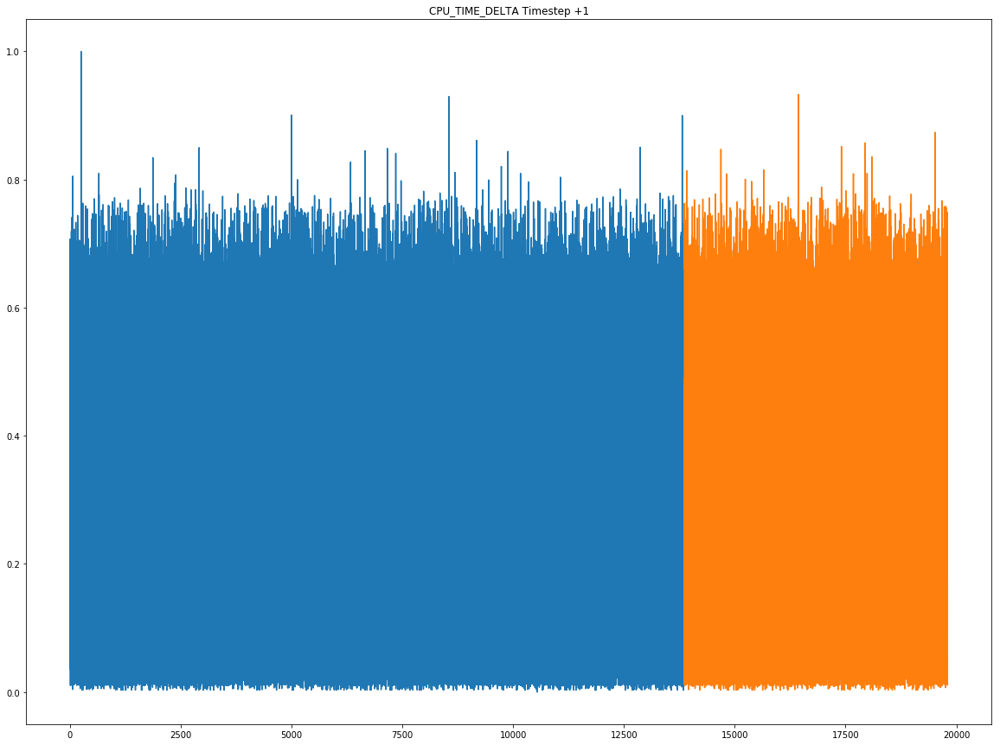

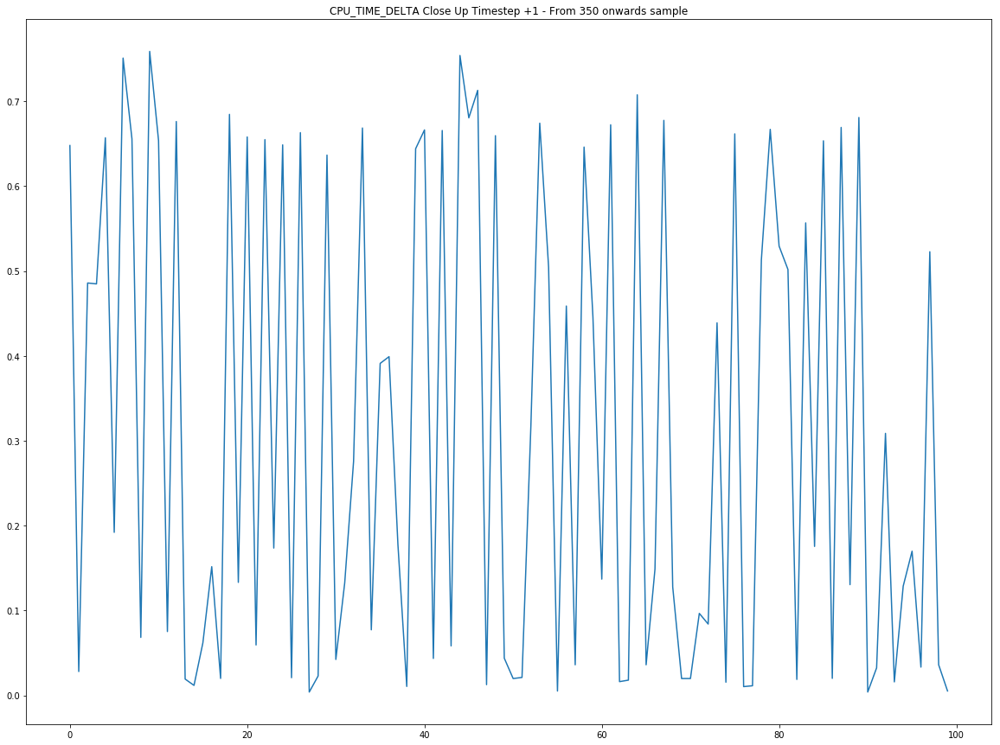

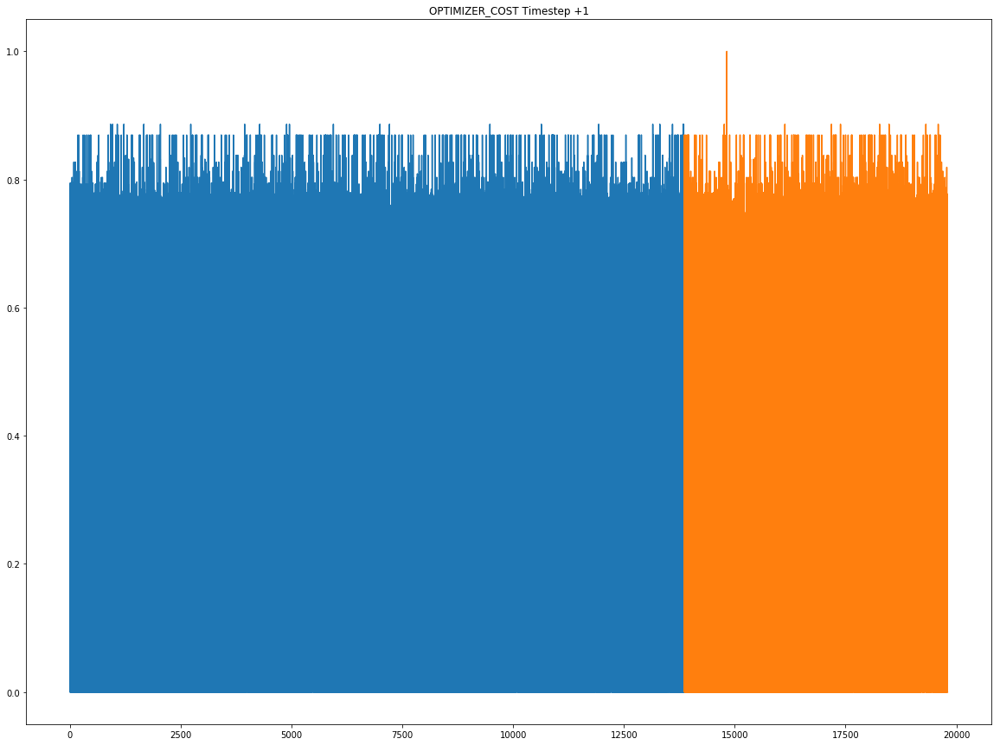

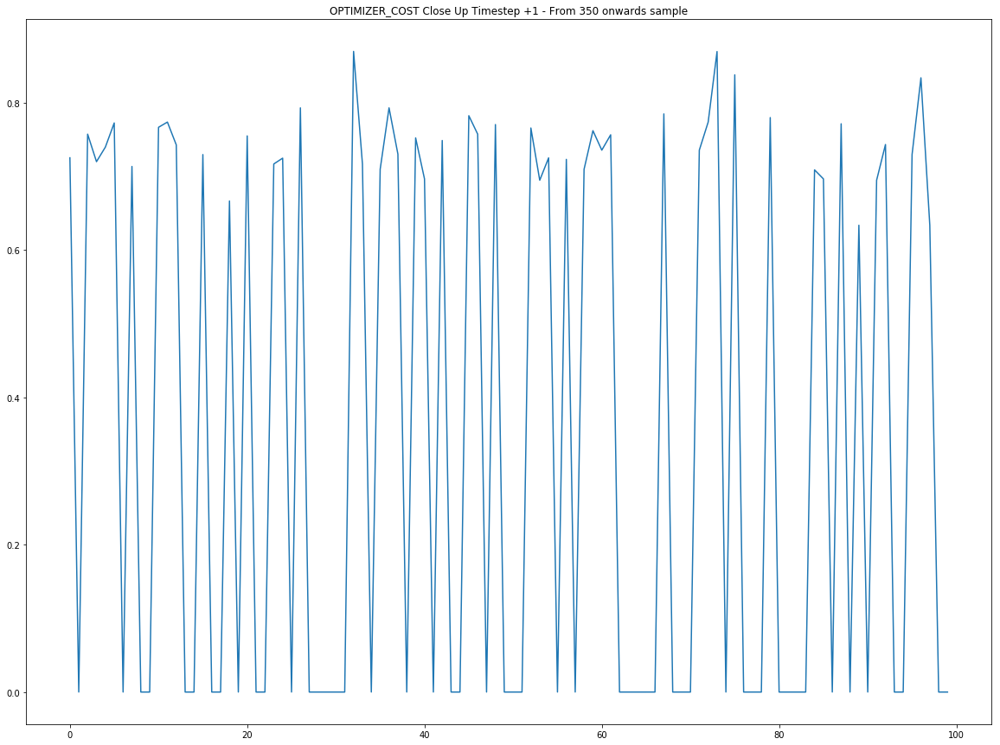

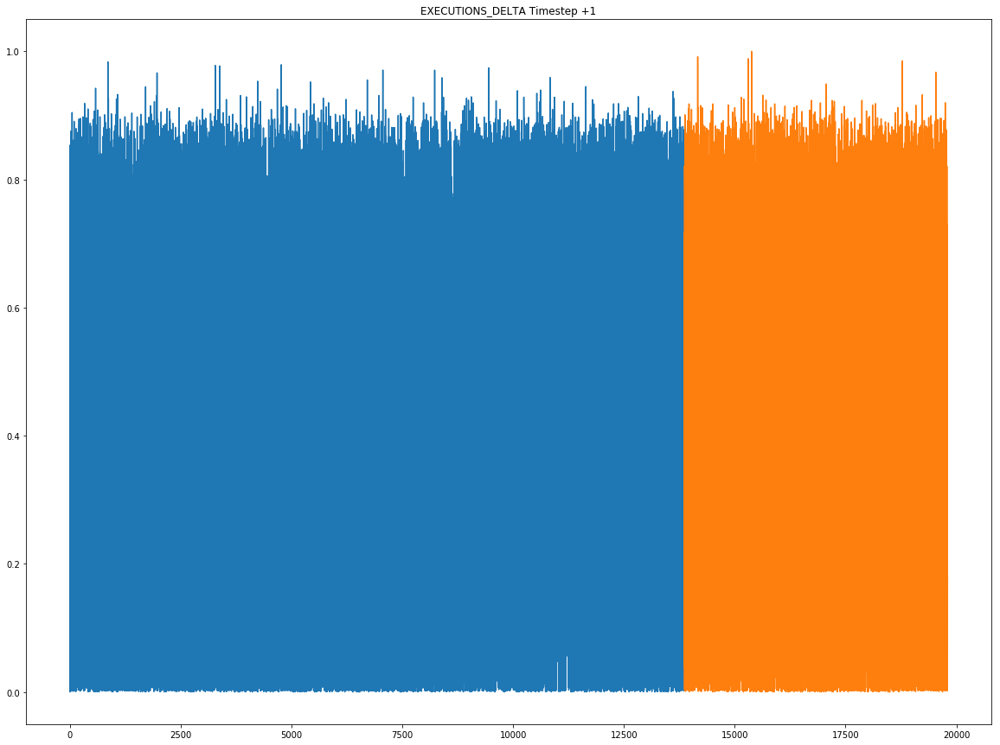

...

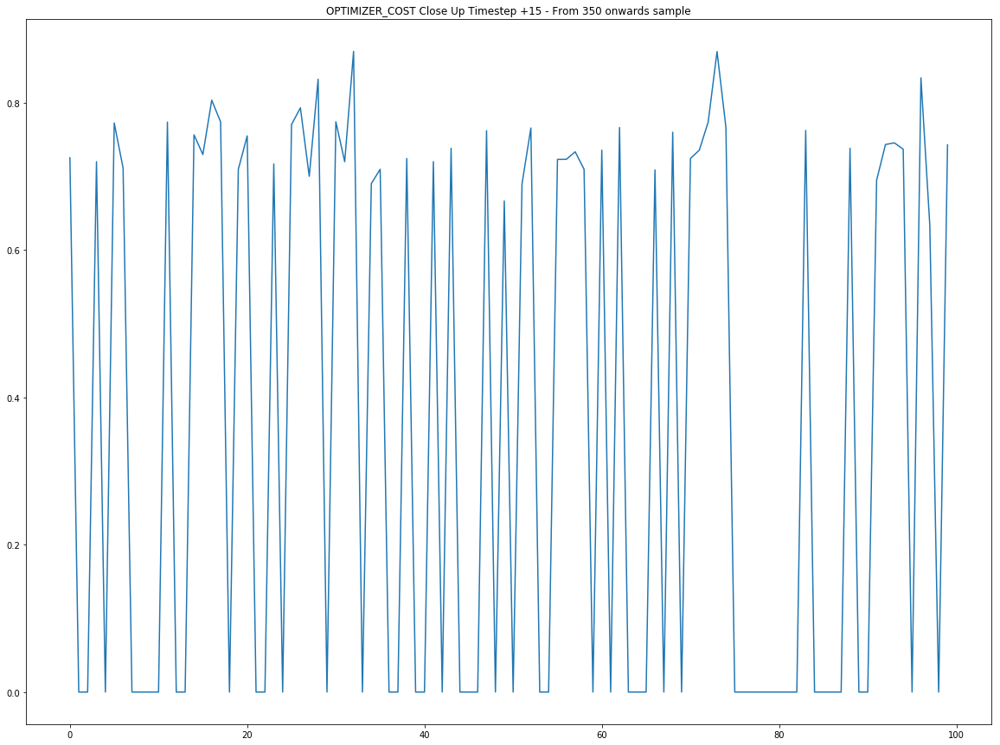

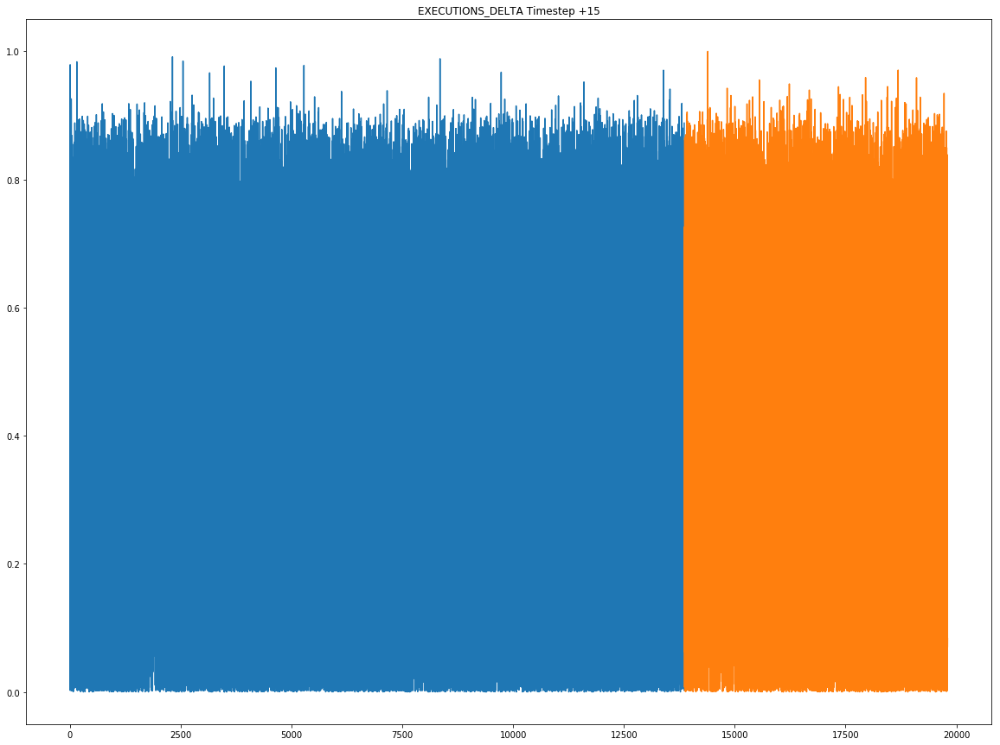

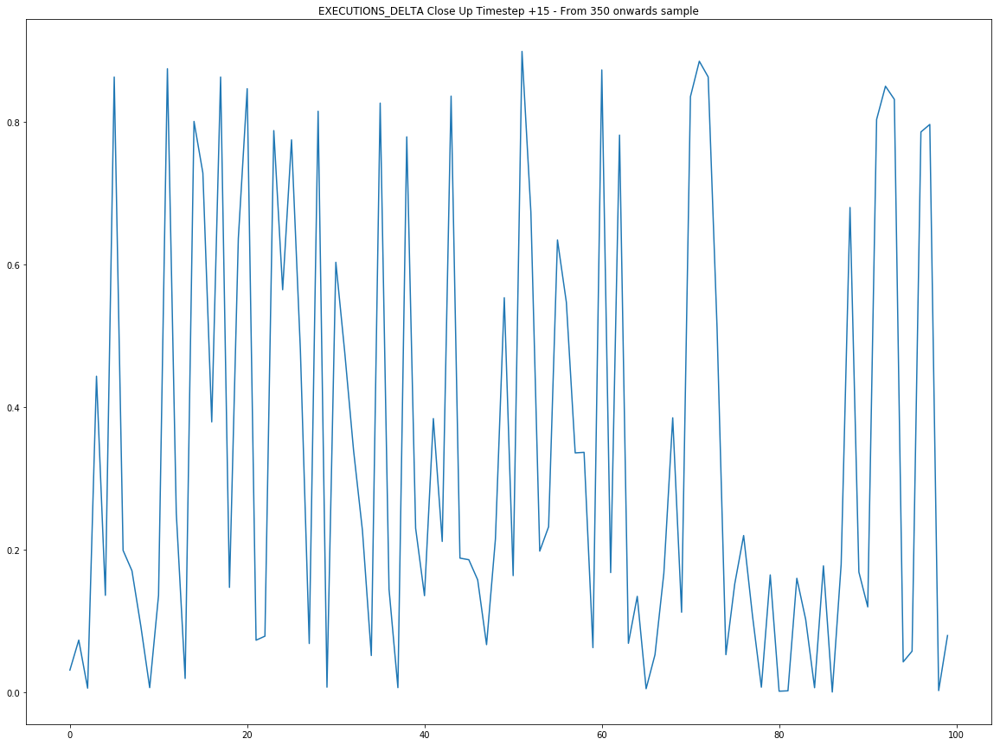

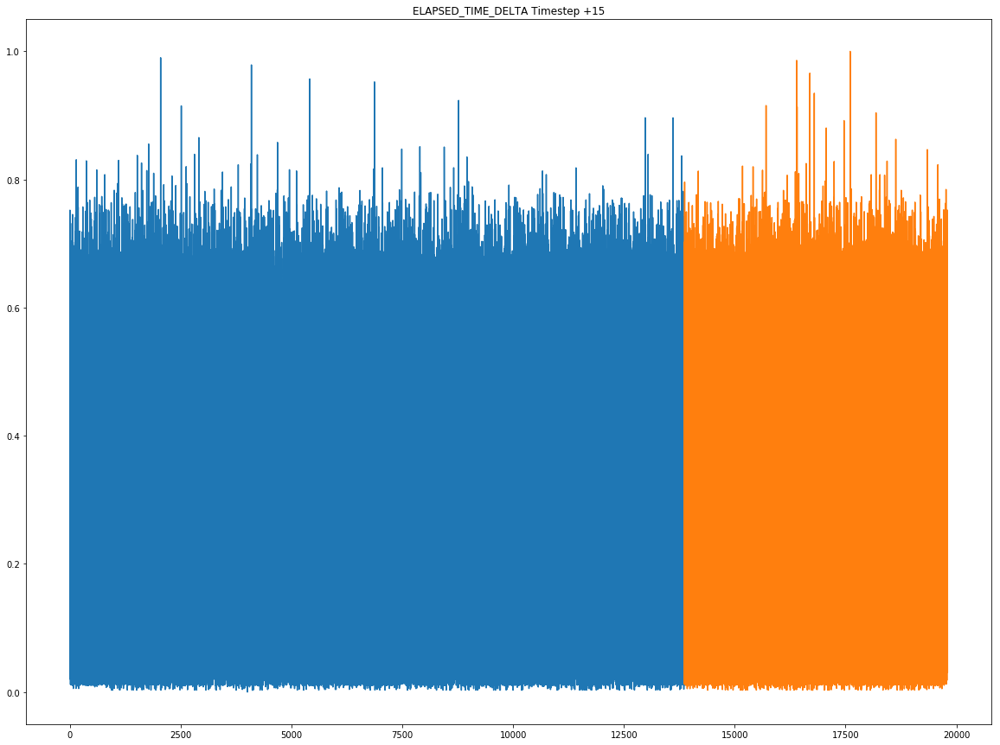

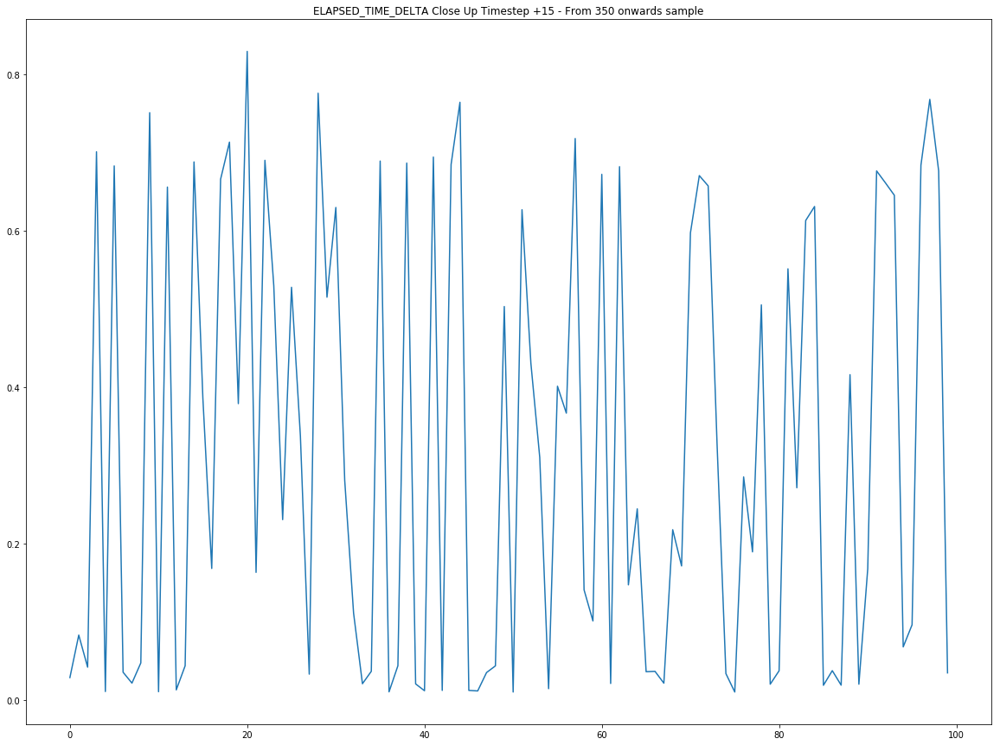

In [49]:
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))

X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
X_test = X_test.values
y_validate = y_validate.values
y_test = y_test.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)))

# Plotting label over time for train, test
for i in range(0, len(y_validate[0])):
  
    # Whole Sample
    plt.rcParams['figure.figsize'] = [20, 15]
    plt.plot(y_train[:,i])
    validate_and_test = list(y_validate[:,i]) + list(y_test[:,i])
    plt.plot([None for j in y_train[:,i]] + [x for x in validate_and_test])
    plt.title(y_label[i%len(y_label)] + " Timestep +" + str(math.ceil((i+1)/len(y_label))))
    plt.show()
   
    # Sub-Sample (100 range)
    plt.rcParams['figure.figsize'] = [20, 15]
    plt.plot([j for j in y_train[sub_sample_start:sub_sample_start+100,i]])
    plt.title(y_label[i%len(y_label)] + " Close Up Timestep +" + str(math.ceil((i+1)/len(y_label))) +" - From " + str(sub_sample_start) + " onwards sample")
    plt.show()

### Discrete Training

This section converts the established features from the continuous domain into the discrete domain. Continous values will be converted into discrete, and used to train the model using such values (Utilizes bucket function).

https://machinelearningmastery.com/make-predictions-long-short-term-memory-models-keras/

In [50]:
class BinClass:
    """
    Takes data column, and scales them into discrete buckets. Parameter 'n' denotes number of buckets. This class needs
    to be defined before the LSTM class, since it is referenced during the prediction stage. Since Keras models output a
    continuous output (even when trained on discrete data), the 'BinClass' is required by the LSTM class.
    """

    @staticmethod
    def __validate(df, n):
        """
        Validates class parameters
        """
        if df is None:
            raise ValueError('Input data parameter is empty!')
        elif n < 2:
            raise ValueError('Number of buckets must be greater than 1')

    @staticmethod
    def __bucket_val(val, threshold, n):
        """
        Receives threshold value and buckets the val according to the passed threshold
        """
        for i in range(1, n+1):
            if val <= threshold * i:
                return i            

    @staticmethod
    def discretize_value(df, n):
        """
        param: df - Input data
        param: n - Number of buckets
        """
        BinClass.__validate(df, n)
        for column in df.columns:
            max_val = df[column].max(skipna=True)
            threshold = max_val / n
            df[column] = df[column].apply(lambda x: BinClass.__bucket_val(x, threshold, n))
            if df[column].isnull().values.any():
                df[column] = df[column].fillna(1)
        return df

## LSTM Regression (Many to Many)
### Designing the network

- The first step is to define your network.
- Neural networks are defined in Keras as a sequence of layers. The container for these layers is the **Sequential class**.
- The first step is to create an instance of the Sequential class. Then you can create your layers and add them in the order that they should be connected.
- The LSTM recurrent layer comprised of memory units is called LSTM().
- A fully connected layer that often follows LSTM layers and is used for outputting a prediction is called Dense().
- The first layer in the network must define the number of inputs to expect.
- Input must be three-dimensional, comprised of samples, timesteps, and features.
    - **Samples:** These are the rows in your data.
    - **Timesteps:** These are the past observations for a feature, such as lag variables.
    - **Features:** These are columns in your data.
- Assuming your data is loaded as a NumPy array, you can convert a 2D dataset to a 3D dataset using the reshape() function in NumPy.

### Relavent Links

Network structure pointers [https://www.heatonresearch.com/2017/06/01/hidden-layers.html]. Rough heuristics to start with:

* The number of hidden neurons should be between the size of the input layer and the size of the output layer.
* The number of hidden neurons should be 2/3 the size of the input layer, plus the size of the output layer.
* The number of hidden neurons should be less than twice the size of the input layer.

--------------------------------------------------------------------------------------------

* https://machinelearningmastery.com/models-sequence-prediction-recurrent-neural-networks/
* https://machinelearningmastery.com/reshape-input-data-long-short-term-memory-networks-keras/
* https://machinelearningmastery.com/5-step-life-cycle-long-short-term-memory-models-keras/
* https://machinelearningmastery.com/stacked-long-short-term-memory-networks/
* https://arxiv.org/pdf/1312.6026.pdf
* https://machinelearningmastery.com/backtest-machine-learning-models-time-series-forecasting/

In [51]:
# LSTM Class
class LSTM:
    """
    Long Short Term Memory Neural Net Class
    """

    def __init__(self, X, y, loss_func, activation, mode='regression', optimizer='sgd', lstm_layers=1, dropout=.0):
        """
        Initiating the class creates a net with the established parameters
        :param X             - (Numpy 2D Array) Training data used to train the model (Features).
        :param y             - (Numpy 2D Array) Test data used to test the model (Labels).
        :param loss_function - (String)  Denotes mode of measure fitting of model (Fitting function).
        :param activation    - (String)  Neuron activation function used to activate/trigger neurons.
        :param mode          - (String)  A flag used to set specific model training mode (Classification OR Regression).
        :param optimizer     - (String)  Denotes which function to us to optimize the model build (eg: Gradient Descent).
        :param lstm_layers   - (Integer) Denotes the number of LSTM layers to be included in the model build.
        :param dropout       - (Float)   Denotes amount of dropout for model. This parameter must be a value between 0 and 1.
        """
        self.mode = mode
        self.model = ke.models.Sequential()
        for i in range(0, lstm_layers-1):  # If lstm_layers == 1, this for loop logic is skipped.
            self.model.add(ke.layers.LSTM(X_train.shape[2], input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))                 
        self.model.add(ke.layers.LSTM(X.shape[2], input_shape=(X.shape[1], X.shape[2])))
        if dropout > 1 and droptout < 0:
            raise ValueError('Dropout parameter exceeded! Must be a value between 0 and 1.')
        self.model.add(Dropout(dropout))
        self.model.add(ke.layers.Dense(y.shape[1]))
        self.model.add(ke.layers.Activation(activation.lower()))
        self.model.compile(loss=loss_func, optimizer=optimizer, metrics=['accuracy'])
        print(self.model.summary())

    def fit_model(self, X_train, X_test, y_train, y_test, epochs=50, batch_size=50, verbose=2, shuffle=False,
                  plot=False):
        """
        Fit data to model & validate. Trains a number of epochs.
        
        :param: X_train    - (Numpy 2D Array) Numpy matrix consisting of input training features
        :param: X_test     - (Numpy 2D Array) Numpy matrix consisting of input validation/testing features
        :param: y_train    - (Numpy 2D Array) Numpy matrix consisting of output training labels
        :param: y_test     - (Numpy 2D Array) Numpy matrix consisting of output validation/testing labels
        :param: epochs     - (Integer) Integer value denoting number of trained epochs
        :param: batch_size - (Integer) Integer value denoting LSTM training batch_size
        :param: verbose    - (Integer) Integer value denoting net verbosity (Amount of information shown to user during LSTM training)
        :param: shuffle    - (Bool) Boolean value denoting whether or not to shuffle data. This parameter must always remain 'False' for time series datasets.
        :param: plot       - (Bool) Boolean value denoting whether this function should plot out it's evaluation
        
        :return: None
        """
        history = self.model.fit(x=X_train,
                                 y=y_train,
                                 epochs=epochs,
                                 batch_size=batch_size,
                                 validation_data=(X_test, y_test),
                                 verbose=verbose,
                                 shuffle=shuffle)
        if plot:
            plt.rcParams['figure.figsize'] = [20, 15]
            if self.mode == 'regression':
                plt.plot(history.history['loss'], label='train')
                plt.plot(history.history['val_loss'], label='validation')
            elif self.mode == 'classification':
                plt.plot(history.history['acc'], label='train')
                plt.plot(history.history['val_acc'], label='validation')
            plt.ylabel('loss')
            plt.xlabel('epoch')
            plt.legend(['train', 'validation'], loc='upper left')
            plt.show()

    def predict(self, X):
        """
        Predicts label/s from input feature 'X'
        
        :param: X - Numpy matrix consisting of a single feature vector
        
        :return: Numpy matrix of predicted label output
        """
        yhat = self.model.predict(X)
        return yhat

    def predict_and_evaluate(self, X, y, y_labels, plot=False, category=1):
        """
        Receives 2D matrix of input features and 2D matrix of output labels, and evaluates input data and target predictions.
        
        :param: X        - (Numpy 2D Array) Numpy array consisting of input feature vectors
        :param: y        - (Numpy 2D Array) Numpy array consisting of target/output labels
        :param: y_labels - (List) List of target label names
        :param: plot     - (Bool) Boolean value denoting whether this function should plot out it's evaluation
        :param: category - (Integer) Integer value denoting category type to use during evaluation. This parameter is 
                           experiment specific, refer to below. Note, that this parameter should always be 
                           established as a value of 1.
        
        :return: None
        """
        yhat = self.predict(X)

        # RMSE Evaluation
        if self.mode == 'regression':
            rmse = math.sqrt(mean_squared_error(y, yhat))
            if not plot:
                return rmse
            print('Reported: ' + str(rmse) + ' rmse')

        elif self.mode == 'classification':
            column_names = []
            for i in range(len(y_labels) * lag):
                column_names.append("column" + str(i))

            # Denote category type
            if category == 1:
                y = pd.DataFrame(y, columns=column_names)
                y = BinClass.discretize_value(y, bin_value)
                y = y.values
            yhat = pd.DataFrame(yhat, columns=column_names)
            yhat = BinClass.discretize_value(yhat, bin_value)
            yhat = yhat.values

            # F1-Score Evaluation
            for i in range(len(y_labels)):
                accuracy = accuracy_score(y[:,i], yhat[:,i])
                precision = precision_score(y[:,i], yhat[:,i], average='micro')
                recall = recall_score(y[:,i], yhat[:,i], average='micro')
                f1 = f1_score(y[:, i], 
                              yhat[:, i],
                              average='micro')  # Calculate metrics globally by counting the total true positives, false negatives and false positives.
                print('Test FScore [' + y_labels[i] + ']: ' + str(f1))
                
        if plot:
            for i in range(0, len(y[0])):
                plt.rcParams['figure.figsize'] = [20, 15]
                plt.plot(y[:, i], label='actual')
                plt.plot(yhat[:, i], label='predicted')
                plt.legend(['actual', 'predicted'], loc='upper left')
                plt.title(y_labels[i%len(y_labels)] + " +" + str(math.ceil((i+1)/len(y_label))))
                plt.show()

    @staticmethod
    def write_results_to_disk(path, iteration, lag, test_split, batch, depth, epoch, score, time_train):
        """
        Static method which is used for test harness utilities. This method attempts a grid search across many
        trained LSTM models, each denoted with different configurations.
        
        Attempted configurations:
        * Varied lag projection
        * Varied data test split
        * Varied batch sizes
        * Varied LSTM neural depth
        * Varied epoch counts
        
        Each configuration is denoted with a score, and used to identify the most optimal configuration.
        
        :param: path       - (String) String denoting result csv output
        :param: iteration  - (Integer) Integer denoting test iteration (Unique per test configuration)
        :param: lag        - (Integer) Integer denoting lag value
        :param: test_split - (Float) Float denoting data sample sizes
        :param: batch      - (Integer) Integer denoting LSTM batch size
        :param: depth      - (Integer) Integer denoting LSTM neuron depth size
        :param: epoch      - (Integer) Integer denoting number of LSTM training iterations
        :param: score      - (Float) Float denoting experiment configuration RSME score
        :param: time_train - (Integer) Integer denoting number of seconds taken by LSTM training iteration
        
        :return: None
        """
        file_exists = os.path.isfile(path)
        with open(path, 'a') as csvfile:
            headers = ['iteration', 'lag', 'test_split', 'batch', 'depth', 'epoch', 'score', 'time_train']
            writer = csv.DictWriter(csvfile, delimiter=',', lineterminator='\n', fieldnames=headers)
            if not file_exists:
                writer.writeheader()  # file doesn't exist yet, write a header
            writer.writerow({'iteration': iteration,
                             'lag': lag,
                             'test_split': test_split,
                             'batch': batch,
                             'depth':depth,
                             'epoch':epoch,
                             'score': score,
                             'time_train': time_train})

### Regression Training + Validation/Testing (1 LSTM Layer + Dropout (0.0) + Dense Output) 

* https://machinelearningmastery.com/update-lstm-networks-training-time-series-forecasting/
* https://machinelearningmastery.com/instability-online-learning-stateful-lstm-time-series-forecasting/

This cell trains a model on the training data subset, and validates on the validating data subset. The Test data subset is not used and is left for future testing.

In [52]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))

X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))

X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)))

# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
   
model = LSTM(X=X_train,
             y=y_train,
             loss_func='mean_squared_error',
             activation='softmax',
             optimizer='adam',
             mode='regression',
             lstm_layers=1,
             dropout=0)
model.fit_model(X_train=X_train,
                X_test=X_validate,
                y_train=y_train,
                y_test=y_validate,
                epochs=epochs, 
                batch_size=batch_size,
                verbose=2, 
                shuffle=False,
                plot=False)
model.predict_and_evaluate(X=X_validate,
                           y=y_validate,
                           y_labels=y_label,
                           plot=False)
model.fit_model(X_train=X_validate,
                X_test=X_test,
                y_train=y_validate,
                y_test=y_test,
                epochs=epochs, 
                batch_size=batch_size, # Incremental batch size fitting
                verbose=2, 
                shuffle=False,
                plot=True)
model.predict_and_evaluate(X=X_test,
                           y=y_test,
                           y_labels=y_label,
                           plot=True)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Regression Training + Validation/Testing (2 LSTM Layer + Dropout (0.0) + Dense Output) 

* https://machinelearningmastery.com/update-lstm-networks-training-time-series-forecasting/
* https://machinelearningmastery.com/instability-online-learning-stateful-lstm-time-series-forecasting/

This cell trains a model on the training data subset, and validates on the validating data subset. The Test data subset is not used and is left for future testing.

In [53]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)))
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#    
model = LSTM(X=X_train,
             y=y_train,
             loss_func='mean_squared_error',
             activation='softmax',
             optimizer='adam',
             mode='regression',
             lstm_layers=2,
             dropout=0)
model.fit_model(X_train=X_train,
                X_test=X_validate,
                y_train=y_train,
                y_test=y_validate,
                epochs=epochs, 
                batch_size=batch_size,
                verbose=2, 
                shuffle=False,
                plot=False)
model.predict_and_evaluate(X=X_validate,
                           y=y_validate,
                           y_labels=y_label,
                           plot=False)
model.fit_model(X_train=X_validate,
                X_test=X_test,
                y_train=y_validate,
                y_test=y_test,
                epochs=epochs, 
                batch_size=batch_size, # Incremental batch size fitting
                verbose=2, 
                shuffle=False,
                plot=True)
model.predict_and_evaluate(X=X_test,
                           y=y_test,
                           y_labels=y_label,
                           plot=True)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Regression Training + Validation/Testing (3 LSTM Layer + Dropout (0.0) + Dense Output) 

* https://machinelearningmastery.com/update-lstm-networks-training-time-series-forecasting/
* https://machinelearningmastery.com/instability-online-learning-stateful-lstm-time-series-forecasting/

This cell trains a model on the training data subset, and validates on the validating data subset. The Test data subset is not used and is left for future testing.

In [54]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)))
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#    
model = LSTM(X=X_train,
             y=y_train,
             loss_func='mean_squared_error',
             activation='softmax',
             optimizer='adam',
             mode='regression',
             lstm_layers=3,
             dropout=0)
model.fit_model(X_train=X_train,
                X_test=X_validate,
                y_train=y_train,
                y_test=y_validate,
                epochs=epochs, 
                batch_size=batch_size,
                verbose=2, 
                shuffle=False,
                plot=False)
model.predict_and_evaluate(X=X_validate,
                           y=y_validate,
                           y_labels=y_label,
                           plot=False)
model.fit_model(X_train=X_validate,
                X_test=X_test,
                y_train=y_validate,
                y_test=y_test,
                epochs=epochs, 
                batch_size=batch_size, # Incremental batch size fitting
                verbose=2, 
                shuffle=False,
                plot=True)
model.predict_and_evaluate(X=X_test,
                           y=y_test,
                           y_labels=y_label,
                           plot=True)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Regression Training + Validation/Testing (1 LSTM Layer + Dropout (0.2) + Dense Output) 

This cell trains a model on the training data subset, and validates on the validating data subset. The Test data subset is not used and is left for future testing.

* https://machinelearningmastery.com/update-lstm-networks-training-time-series-forecasting/
* https://machinelearningmastery.com/instability-online-learning-stateful-lstm-time-series-forecasting/

In [55]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)))
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#    
model = LSTM(X=X_train,
             y=y_train,
             loss_func='mean_squared_error',
             activation='softmax',
             optimizer='adam',
             mode='regression',
             lstm_layers=1,
             dropout=.2)
model.fit_model(X_train=X_train,
                X_test=X_validate,
                y_train=y_train,
                y_test=y_validate,
                epochs=epochs, 
                batch_size=batch_size,
                verbose=2, 
                shuffle=False,
                plot=False)
model.predict_and_evaluate(X=X_validate,
                           y=y_validate,
                           y_labels=y_label,
                           plot=False)
model.fit_model(X_train=X_validate,
                X_test=X_test,
                y_train=y_validate,
                y_test=y_test,
                epochs=epochs, 
                batch_size=batch_size, # Incremental batch size fitting
                verbose=2, 
                shuffle=False,
                plot=True)
model.predict_and_evaluate(X=X_test,
                           y=y_test,
                           y_labels=y_label,
                           plot=True)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Regression Training + Validation/Testing (2 LSTM Layer + Dropout (0.2) + Dense Output) 

This cell trains a model on the training data subset, and validates on the validating data subset. The Test data subset is not used and is left for future testing.

* https://machinelearningmastery.com/update-lstm-networks-training-time-series-forecasting/
* https://machinelearningmastery.com/instability-online-learning-stateful-lstm-time-series-forecasting/

In [56]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)))
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#    
model = LSTM(X=X_train,
             y=y_train,
             loss_func='mean_squared_error',
             activation='softmax',
             optimizer='adam',
             mode='regression',
             lstm_layers=2,
             dropout=.2)
model.fit_model(X_train=X_train,
                X_test=X_validate,
                y_train=y_train,
                y_test=y_validate,
                epochs=epochs, 
                batch_size=batch_size,
                verbose=2, 
                shuffle=False,
                plot=False)
model.predict_and_evaluate(X=X_validate,
                           y=y_validate,
                           y_labels=y_label,
                           plot=False)
model.fit_model(X_train=X_validate,
                X_test=X_test,
                y_train=y_validate,
                y_test=y_test,
                epochs=epochs, 
                batch_size=batch_size, # Incremental batch size fitting
                verbose=2, 
                shuffle=False,
                plot=True)
model.predict_and_evaluate(X=X_test,
                           y=y_test,
                           y_labels=y_label,
                           plot=True)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Regression Training + Validation/Testing (3 LSTM Layer + Dropout (0.2) + Dense Output) 

This cell trains a model on the training data subset, and validates on the validating data subset. The Test data subset is not used and is left for future testing.

* https://machinelearningmastery.com/update-lstm-networks-training-time-series-forecasting/
* https://machinelearningmastery.com/instability-online-learning-stateful-lstm-time-series-forecasting/

In [57]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)))
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#    
model = LSTM(X=X_train,
             y=y_train,
             loss_func='mean_squared_error',
             activation='softmax',
             optimizer='adam',
             mode='regression',
             lstm_layers=3,
             dropout=.2)
model.fit_model(X_train=X_train,
                X_test=X_validate,
                y_train=y_train,
                y_test=y_validate,
                epochs=epochs, 
                batch_size=batch_size,
                verbose=2, 
                shuffle=False,
                plot=False)
model.predict_and_evaluate(X=X_validate,
                           y=y_validate,
                           y_labels=y_label,
                           plot=False)
model.fit_model(X_train=X_validate,
                X_test=X_test,
                y_train=y_validate,
                y_test=y_test,
                epochs=epochs, 
                batch_size=batch_size, # Incremental batch size fitting
                verbose=2, 
                shuffle=False,
                plot=True)
model.predict_and_evaluate(X=X_test,
                           y=y_test,
                           y_labels=y_label,
                           plot=True)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

## LSTM Classification

This section is split into categories:
* Category 1 deals with a regression output neural network, whose outputs are binned into categorical outputs. The network is trained to deal with a regression problem, whose outputs are eventuall converted into categorical data
* Category 2 deals with a classification neural network. The network is trained to deal with classification categorical data, and used to output classification labels

Below is a list of the metrics that you can use in Keras on classification problems.

* Binary Accuracy: binary_accuracy, acc
* Categorical Accuracy: categorical_accuracy, acc
* Sparse Categorical Accuracy: sparse_categorical_accuracy
* Top k Categorical Accuracy: top_k_categorical_accuracy (requires you specify a k parameter)
* Sparse Top k Categorical Accuracy: sparse_top_k_categorical_accuracy (requires you specify a k parameter)

--------------------------------------------------------------------------------------------------

* https://machinelearningmastery.com/multi-class-classification-tutorial-keras-deep-learning-library/
* https://machinelearningmastery.com/custom-metrics-deep-learning-keras-python/
* https://machinelearningmastery.com/sequence-classification-lstm-recurrent-neural-networks-python-keras/
* https://www.depends-on-the-definition.com/guide-to-multi-label-classification-with-neural-networks/

## Classification (Category 1)

### Classification (Category 1) Training + Validation/Testing (1 LSTM Layer + Dropout (0.0) + Dense Output) 

Category 1 deals with a regression output neural network, whose outputs are binned into categorical outputs. The network is trained to deal with a regression problem, whose outputs are eventuall converted into categorical data

In [58]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=1,
                      dropout=0)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=1)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=1)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Classification (Category 1) Training + Validation/Testing (2 LSTM Layer + Dropout (0.0) + Dense Output) 

Category 1 deals with a regression output neural network, whose outputs are binned into categorical outputs. The network is trained to deal with a regression problem, whose outputs are eventuall converted into categorical data

In [59]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=2,
                      dropout=0)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=1)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=1)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Classification (Category 1) Training + Validation/Testing (3 LSTM Layer + Dropout (0.0) + Dense Output) 

Category 1 deals with a regression output neural network, whose outputs are binned into categorical outputs. The network is trained to deal with a regression problem, whose outputs are eventuall converted into categorical data

In [60]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=3,
                      dropout=0)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=1)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=1)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Classification (Category 1) Training + Validation/Testing (1 LSTM Layer + Dropout (0.2) + Dense Output) 

Category 1 deals with a regression output neural network, whose outputs are binned into categorical outputs. The network is trained to deal with a regression problem, whose outputs are eventuall converted into categorical data

In [61]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=1,
                      dropout=.2)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=1)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=1)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Classification (Category 1) Training + Validation/Testing (2 LSTM Layer + Dropout (0.2) + Dense Output) 

Category 1 deals with a regression output neural network, whose outputs are binned into categorical outputs. The network is trained to deal with a regression problem, whose outputs are eventuall converted into categorical data

In [62]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=2,
                      dropout=.2)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=1)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=1)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Classification (Category 1) Training + Validation/Testing (3 LSTM Layer + Dropout (0.2) + Dense Output) 

Category 1 deals with a regression output neural network, whose outputs are binned into categorical outputs. The network is trained to deal with a regression problem, whose outputs are eventuall converted into categorical data

In [63]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=3,
                      dropout=.2)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=1)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=1)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

## Classification - Category 2

This cell is dedicated to binning data into a predefined number of buckets (Continuous to Discrete Conversion). By converting the data into a number of discrete data samples, the data can effectively be trained into a classification function.

In [64]:
%%time
print('Before: ')
print(X_df.shape)
X_df = BinClass.discretize_value(X_df, bin_value)
print('After: ')
print(X_df.shape)
print(X_df.head())
print('--------------------------------------------------------------------------')
print('Before: ')
print(y_df.shape)
y_df = BinClass.discretize_value(y_df, bin_value)
print('After: ')
print(y_df.shape)
print(y_df.head())

Before: 
(19801, 8176)


KeyboardInterrupt: 

### Classification (Category 2) Training + Validation/Testing (1 LSTM Layer + Dropout (0.0) + Dense Output) 

Category 2 deals with a classification neural netowrk. The network is trained to deal with classification categorical data, and used to output classification labels

In [65]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=1,
                      dropout=.0)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=2)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=2)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


KeyboardInterrupt: 

### Classification (Category 2) Training + Validation/Testing (2 LSTM Layer + Dropout (0.0) + Dense Output) 

Category 2 deals with a classification neural netowrk. The network is trained to deal with classification categorical data, and used to output classification labels

In [66]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=2,
                      dropout=.0)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=2)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=2)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Classification (Category 2) Training + Validation/Testing (3 LSTM Layer + Dropout (0.0) + Dense Output) 

Category 2 deals with a classification neural netowrk. The network is trained to deal with classification categorical data, and used to output classification labels

In [67]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=3,
                      dropout=.0)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=2)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=2)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Classification (Category 2) Training + Validation/Testing (1 LSTM Layer + Dropout (0.2) + Dense Output) 

Category 2 deals with a classification neural netowrk. The network is trained to deal with classification categorical data, and used to output classification labels

In [68]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=1,
                      dropout=.2)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=2)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=2)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 8176)] Type - <class 'numpy.ndarray'>
y_validate shape [(2970, 60)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 8176)] Type - <class 'numpy.ndarray'>
y_test shape [(2971, 60)] Type - <class 'numpy.ndarray'>
------------------------------

Reshaping Training Frames
X_train shape [(13860, 1, 8176)] Type - <class 'numpy.ndarray'>
X_validate shape [(2970, 1, 8176)] Type - <class 'numpy.ndarray'>
X_test shape [(2971, 1, 8176)] Type - <class 'numpy.ndarray'>


MemoryError: 

### Classification (Category 2) Training + Validation/Testing (2 LSTM Layer + Dropout (0.2) + Dense Output) 

Category 2 deals with a classification neural netowrk. The network is trained to deal with classification categorical data, and used to output classification labels

In [69]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=2,
                      dropout=.2)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=2)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=2)

X_train shape [(13860, 8176)] Type - <class 'numpy.ndarray'>
y_train shape [(13860, 60)] Type - <class 'numpy.ndarray'>


KeyboardInterrupt: 

### Classification (Category 2) Training + Validation/Testing (3 LSTM Layer + Dropout (0.2) + Dense Output) 

Category 2 deals with a classification neural netowrk. The network is trained to deal with classification categorical data, and used to output classification labels

In [70]:
%%time
X_train, X_validate, y_train, y_validate = train_test_split(X_df, y_df, test_size=test_split)
X_train = X_train.values
y_train = y_train.values
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("y_train shape [" + str(y_train.shape) + "] Type - " + str(type(y_train)))
#
X_validate, X_test, y_validate, y_test = train_test_split(X_validate, y_validate, test_size=.5)
X_validate = X_validate.values
y_validate = y_validate.values
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("y_validate shape [" + str(y_validate.shape) + "] Type - " + str(type(y_validate)))
#
X_test = X_test.values
y_test = y_test.values
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
print("y_test shape [" + str(y_test.shape) + "] Type - " + str(type(y_test)) + "\n------------------------------")
#
# Reshape for fitting in LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_validate = X_validate.reshape((X_validate.shape[0], 1, X_validate.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print('\nReshaping Training Frames')
print("X_train shape [" + str(X_train.shape) + "] Type - " + str(type(X_train)))
print("X_validate shape [" + str(X_validate.shape) + "] Type - " + str(type(X_validate)))
print("X_test shape [" + str(X_test.shape) + "] Type - " + str(type(X_test)))
#
# Train on discrete data (Train > Validation)
discrete_model = LSTM(X=X_train,
                      y=y_train,
                      loss_func='categorical_crossentropy',
                      activation='sigmoid',
                      optimizer='adam',
                      mode='classification',
                      lstm_layers=3,
                      dropout=.2)
discrete_model.fit_model(X_train=X_train,
                         X_test=X_validate,
                         y_train=y_train,
                         y_test=y_validate,
                         epochs=epochs, 
                         batch_size=batch_size,
                         verbose=2, 
                         shuffle=False,
                         plot=False)
discrete_model.predict_and_evaluate(X=X_validate,
                                    y=y_validate,
                                    y_labels=y_label,
                                    plot=False,
                                    category=2)
#
# Train on discrete data (Train + Validation > Test)
discrete_model.fit_model(X_train=X_validate,
                         X_test=X_test,
                         y_train=y_validate,
                         y_test=y_test,
                         epochs=epochs, 
                         batch_size=1, # Incremental batch size fitting
                         verbose=2, 
                         shuffle=False,
                         plot=True)
discrete_model.predict_and_evaluate(X=X_test,
                                    y=y_test,
                                    y_labels=y_label,
                                    plot=True,
                                    category=2)

KeyboardInterrupt: 